In [ ]:
import numpy as np
#pandas 1.5.0. or higher required
import pandas as pd
pd.set_option('display.max_columns', None)
from sklearn.preprocessing import PowerTransformer
import seaborn as sns
import matplotlib.pyplot as plt
from Helper_Functions_MC import simulation_demonstration
import warnings
warnings.filterwarnings("ignore")

In [ ]:
# Read raw data
Small = pd.read_csv("Small.csv")
German = pd.read_csv("German.csv", sep=' ', header=None)
Deloitte = pd.read_csv("Deloitte.csv")
Large = pd.read_csv("Large.csv")

In [ ]:
# Dummify categorical status feature
enc_df=pd.get_dummies(Small['Loan_Status'])

In [ ]:
# Rename to BAD
Small['BAD'] = enc_df['N']

In [ ]:
# Round credit history
Small['Credit_History'] = Small['Credit_History'].round()


In [ ]:
Small.describe(include='all')

,Loan_ID,Gender,Married,Dependents,Education,Self_Employed,ApplicantIncome,CoapplicantIncome,LoanAmount,Loan_Amount_Term,Credit_History,property_Area,Loan_Status,BAD
count,614,599,611,599,613,582,612.000000,613.000000,592.000000,600.00000,564.000000,614,614,614.000000
unique,614,2,2,4,2,2,NaN,NaN,NaN,NaN,NaN,3,2,NaN
top,LP001002,Male,Yes,0,Graduate,No,NaN,NaN,NaN,NaN,NaN,Semiurban,Y,NaN
freq,1,487,398,345,479,500,NaN,NaN,NaN,NaN,NaN,233,422,NaN
mean,NaN,NaN,NaN,NaN,NaN,NaN,5405.540850,1620.888940,146.412162,342.00000,0.842199,NaN,NaN,0.312704
std,NaN,NaN,NaN,NaN,NaN,NaN,6118.914057,2928.624748,85.587325,65.12041,0.364878,NaN,NaN,0.463973
min,NaN,NaN,NaN,NaN,NaN,NaN,150.000000,0.000000,9.000000,12.00000,0.000000,NaN,NaN,0.000000
25%,NaN,NaN,NaN,NaN,NaN,NaN,2875.750000,0.000000,100.000000,360.00000,1.000000,NaN,NaN,0.000000
50%,NaN,NaN,NaN,NaN,NaN,NaN,3806.000000,1167.000000,128.000000,360.00000,1.000000,NaN,NaN,0.000000
75%,NaN,NaN,NaN,NaN,NaN,NaN,5803.750000,2302.000000,168.000000,360.00000,1.000000,NaN,NaN,1.000000


In [ ]:
# Delete useless features
del Small ['Loan_ID'], Small ['Loan_Status']

In [ ]:
# Transform BAD to boolean
German[20] = German[20] -1

In [ ]:
# Rename columns according to source
German.columns = ['Status_of_existing_checking_account', 'Duration_in_month', 'Credit_history', 'Purpose', 'Savings_account/bonds',
                  'Credit_amount', 'Present_employment_since', 'Installment_rate_in_percentage_of_disposable_income', 
                  'Personal_status_and_sex', 'Other_debtors/guarantors', 'Present_residence_since', 'Property', 'Age_in_years',
                  'Other_installment_plans','Housing', 'Number_of_existing_credits_at_this_bank', 'Job', 
                  'Number_of_people_being_liable_to_provide_maintenance_for', 'Telephone', 'foreign_worker', 'BAD']

In [ ]:
German

,Status_of_existing_checking_account,Duration_in_month,Credit_history,Purpose,Savings_account/bonds,Credit_amount,Present_employment_since,Installment_rate_in_percentage_of_disposable_income,Personal_status_and_sex,Other_debtors/guarantors,Present_residence_since,Property,Age_in_years,Other_installment_plans,Housing,Number_of_existing_credits_at_this_bank,Job,Number_of_people_being_liable_to_provide_maintenance_for,Telephone,foreign_worker,BAD
0,A11,6,A34,A43,1169,A65,A75,4,A93,A101,4,A121,67,A143,A152,2,A173,1,A192,A201,0
1,A12,48,A32,A43,5951,A61,A73,2,A92,A101,2,A121,22,A143,A152,1,A173,1,A191,A201,1
2,A14,12,A34,A46,2096,A61,A74,2,A93,A101,3,A121,49,A143,A152,1,A172,2,A191,A201,0
3,A11,42,A32,A42,7882,A61,A74,2,A93,A103,4,A122,45,A143,A153,1,A173,2,A191,A201,0
4,A11,24,A33,A40,4870,A61,A73,3,A93,A101,4,A124,53,A143,A153,2,A173,2,A191,A201,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,A14,12,A32,A42,1736,A61,A74,3,A92,A101,4,A121,31,A143,A152,1,A172,1,A191,A201,0
996,A11,30,A32,A41,3857,A61,A73,4,A91,A101,4,A122,40,A143,A152,1,A174,1,A192,A201,0
997,A14,12,A32,A43,804,A61,A75,4,A93,A101,4,A123,38,A143,A152,1,A173,1,A191,A201,0
998,A11,45,A32,A43,1845,A61,A73,4,A93,A101,4,A124,23,A143,A153,1,A173,1,A192,A201,1


In [ ]:
Deloitte

,ID,Loan Amount,Funded Amount,Funded Amount Investor,Term,Batch Enrolled,Interest Rate,Grade,Sub Grade,Employment Duration,Home Ownership,Verification Status,Payment Plan,Loan Title,Debit to Income,Delinquency - two years,Inquires - six months,Open Account,Public Record,Revolving Balance,Revolving Utilities,Total Accounts,Initial List Status,Total Received Interest,Total Received Late Fee,Recoveries,Collection Recovery Fee,Collection 12 months Medical,Application Type,Last week Pay,Accounts Delinquent,Total Collection Amount,Total Current Balance,Total Revolving Credit Limit,Loan Status
0,65087372,10000,32236,12329.36286,59,BAT2522922,11.135007,B,C4,MORTGAGE,176346.62670,Not Verified,n,Debt Consolidation,16.284758,1,0,13,0,24246,74.932551,7,w,2929.646315,0.102055,2.498291,0.793724,0,INDIVIDUAL,49,0,31,311301,6619,0
1,1450153,3609,11940,12191.99692,59,BAT1586599,12.237563,C,D3,RENT,39833.92100,Source Verified,n,Debt consolidation,15.412409,0,0,12,0,812,78.297186,13,f,772.769385,0.036181,2.377215,0.974821,0,INDIVIDUAL,109,0,53,182610,20885,0
2,1969101,28276,9311,21603.22455,59,BAT2136391,12.545884,F,D4,MORTGAGE,91506.69105,Source Verified,n,Debt Consolidation,28.137619,0,0,14,0,1843,2.073040,20,w,863.324396,18.778660,4.316277,1.020075,0,INDIVIDUAL,66,0,34,89801,26155,0
3,6651430,11170,6954,17877.15585,59,BAT2428731,16.731201,C,C3,MORTGAGE,108286.57590,Source Verified,n,Debt consolidation,18.043730,1,0,7,0,13819,67.467951,12,w,288.173196,0.044131,0.107020,0.749971,0,INDIVIDUAL,39,0,40,9189,60214,0
4,14354669,16890,13226,13539.92667,59,BAT5341619,15.008300,C,D4,MORTGAGE,44234.82545,Source Verified,n,Credit card refinancing,17.209886,1,3,13,1,1544,85.250761,22,w,129.239553,19.306646,1294.818751,0.368953,0,INDIVIDUAL,18,0,430,126029,22579,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
67458,16164945,13601,6848,13175.28583,59,BAT3193689,9.408858,C,A4,MORTGAGE,83961.15003,Verified,n,Credit card refinancing,28.105127,1,0,13,0,4112,97.779389,19,w,1978.945960,0.023478,564.614852,0.865230,0,INDIVIDUAL,69,0,48,181775,34301,1
67459,35182714,8323,11046,15637.46301,59,BAT1780517,9.972104,C,B3,RENT,65491.12817,Source Verified,n,Credit card refinancing,17.694279,0,0,12,0,9737,15.690703,14,w,3100.803125,0.027095,2.015494,1.403368,0,INDIVIDUAL,14,0,37,22692,8714,0
67460,16435904,15897,32921,12329.45775,59,BAT1761981,19.650943,A,F3,MORTGAGE,34813.96985,Verified,n,Lending loan,10.295774,0,0,7,1,2195,1.500090,9,w,2691.995532,0.028212,5.673092,1.607093,0,INDIVIDUAL,137,0,17,176857,42330,0
67461,5300325,16567,4975,21353.68465,59,BAT2333412,13.169095,D,E3,OWN,96938.83564,Not Verified,n,Debt consolidation,7.614624,0,0,14,0,1172,68.481882,15,f,3659.334202,0.074508,1.157454,0.207608,0,INDIVIDUAL,73,0,61,361339,39075,0


In [ ]:
# Rename status to BAD
Deloitte.rename(columns={'Loan Status':'BAD'}, inplace=True)


In [ ]:
# Delete useless features and those with two high dimensionality
del Deloitte['ID'], Deloitte['Batch Enrolled'], Deloitte['Loan Title']

In [ ]:
Large.describe(include='all')

,ID,year,loan_limit,Gender,approv_in_adv,loan_type,loan_purpose,Credit_Worthiness,open_credit,business_or_commercial,loan_amount,rate_of_interest,Interest_rate_spread,Upfront_charges,term,Neg_ammortization,interest_only,lump_sum_payment,property_value,construction_type,occupancy_type,Secured_by,total_units,income,credit_type,Credit_Score,co-applicant_credit_type,age,submission_of_application,LTV,Region,Security_Type,Status,dtir1
count,148670.000000,148670.0,145326,148670,147762,148670,148536,148670,148670,148670,1.486700e+05,112231.000000,112031.000000,109028.000000,148629.000000,148549,148670,148670,1.335720e+05,148670,148670,148670,148670,139520.000000,148670,148670.000000,148670,148470,148470,133572.000000,148670,148670,148670.000000,124549.000000
unique,NaN,NaN,2,4,2,3,4,2,2,2,NaN,NaN,NaN,NaN,NaN,2,2,2,NaN,2,3,2,4,NaN,4,NaN,2,7,2,NaN,4,2,NaN,NaN
top,NaN,NaN,cf,Male,nopre,type1,p3,l1,nopc,nob/c,NaN,NaN,NaN,NaN,NaN,not_neg,not_int,not_lpsm,NaN,sb,pr,home,1U,NaN,CIB,NaN,CIB,45-54,to_inst,NaN,North,direct,NaN,NaN
freq,NaN,NaN,135348,42346,124621,113173,55934,142344,148114,127908,NaN,NaN,NaN,NaN,NaN,133420,141560,145286,NaN,148637,138201,148637,146480,NaN,48152,NaN,74392,34720,95814,NaN,74722,148637,NaN,NaN
mean,99224.500000,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.311177e+05,4.045476,0.441656,3224.996127,335.136582,NaN,NaN,NaN,4.978935e+05,NaN,NaN,NaN,NaN,6957.338876,NaN,699.789103,NaN,NaN,NaN,72.746457,NaN,NaN,0.246445,37.732932
std,42917.476598,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.839093e+05,0.561391,0.513043,3251.121510,58.409084,NaN,NaN,NaN,3.599353e+05,NaN,NaN,NaN,NaN,6496.586382,NaN,115.875857,NaN,NaN,NaN,39.967603,NaN,NaN,0.430942,10.545435
min,24890.000000,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.650000e+04,0.000000,-3.638000,0.000000,96.000000,NaN,NaN,NaN,8.000000e+03,NaN,NaN,NaN,NaN,0.000000,NaN,500.000000,NaN,NaN,NaN,0.967478,NaN,NaN,0.000000,5.000000
25%,62057.250000,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.965000e+05,3.625000,0.076000,581.490000,360.000000,NaN,NaN,NaN,2.680000e+05,NaN,NaN,NaN,NaN,3720.000000,NaN,599.000000,NaN,NaN,NaN,60.474860,NaN,NaN,0.000000,31.000000
50%,99224.500000,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.965000e+05,3.990000,0.390400,2596.450000,360.000000,NaN,NaN,NaN,4.180000e+05,NaN,NaN,NaN,NaN,5760.000000,NaN,699.000000,NaN,NaN,NaN,75.135870,NaN,NaN,0.000000,39.000000
75%,136391.750000,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.365000e+05,4.375000,0.775400,4812.500000,360.000000,NaN,NaN,NaN,6.280000e+05,NaN,NaN,NaN,NaN,8520.000000,NaN,800.000000,NaN,NaN,NaN,86.184211,NaN,NaN,0.000000,45.000000


In [ ]:
# Delete non-retail loans
Large = Large[Large['business_or_commercial'] == 'nob/c']


In [ ]:
Large.describe(include='all')

,ID,year,loan_limit,Gender,approv_in_adv,loan_type,loan_purpose,Credit_Worthiness,open_credit,business_or_commercial,loan_amount,rate_of_interest,Interest_rate_spread,Upfront_charges,term,Neg_ammortization,interest_only,lump_sum_payment,property_value,construction_type,occupancy_type,Secured_by,total_units,income,credit_type,Credit_Score,co-applicant_credit_type,age,submission_of_application,LTV,Region,Security_Type,Status,dtir1
count,127908.000000,127908.0,125109,127908,127120,127908,127804,127908,127908,127908,1.279080e+05,98482.000000,98441.000000,95642.000000,127867.000000,127800,127908,127908,1.151050e+05,127908,127908,127908,127908,122364.000000,127908,127908.000000,127908,127867,127867,115105.000000,127908,127908,127908.000000,109677.000000
unique,NaN,NaN,2,4,2,2,4,2,2,1,NaN,NaN,NaN,NaN,NaN,2,2,2,NaN,2,3,2,4,NaN,4,NaN,2,7,2,NaN,4,2,NaN,NaN
top,NaN,NaN,cf,Male,nopre,type1,p4,l1,nopc,nob/c,NaN,NaN,NaN,NaN,NaN,not_neg,not_int,not_lpsm,NaN,sb,pr,home,1U,NaN,CIB,NaN,EXP,45-54,to_inst,NaN,North,direct,NaN,NaN
freq,NaN,NaN,116232,36645,107400,113173,48731,122496,127352,127908,NaN,NaN,NaN,NaN,NaN,115008,121713,125107,NaN,127885,117443,127885,125926,NaN,41857,NaN,64504,29575,80312,NaN,64432,127885,NaN,NaN
mean,99205.907308,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.431580e+05,4.056273,0.366415,3409.544461,332.938960,NaN,NaN,NaN,5.290231e+05,NaN,NaN,NaN,NaN,7301.624988,NaN,699.825515,NaN,NaN,NaN,70.537870,NaN,NaN,0.230377,37.051579
std,42916.298083,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.867794e+05,0.565598,0.476660,3322.829886,60.616468,NaN,NaN,NaN,3.725618e+05,NaN,NaN,NaN,NaN,6786.511385,NaN,115.759382,NaN,NaN,NaN,18.717730,NaN,NaN,0.421075,10.213314
min,24890.000000,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.650000e+04,0.000000,-3.638000,0.000000,96.000000,NaN,NaN,NaN,1.800000e+04,NaN,NaN,NaN,NaN,0.000000,NaN,500.000000,NaN,NaN,NaN,0.967478,NaN,NaN,0.000000,5.000000
25%,62053.750000,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.065000e+05,3.625000,0.036400,785.017500,360.000000,NaN,NaN,NaN,2.980000e+05,NaN,NaN,NaN,NaN,3960.000000,NaN,600.000000,NaN,NaN,NaN,59.085903,NaN,NaN,0.000000,31.000000
50%,99148.500000,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.065000e+05,3.990000,0.323400,2836.855000,360.000000,NaN,NaN,NaN,4.480000e+05,NaN,NaN,NaN,NaN,6000.000000,NaN,699.000000,NaN,NaN,NaN,73.329493,NaN,NaN,0.000000,38.000000
75%,136425.250000,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.465000e+05,4.500000,0.652000,5031.250000,360.000000,NaN,NaN,NaN,6.580000e+05,NaN,NaN,NaN,NaN,8880.000000,NaN,800.000000,NaN,NaN,NaN,83.266129,NaN,NaN,0.000000,44.000000


In [ ]:
# Delete useless features
del Large ['ID'], Large ['business_or_commercial']

In [ ]:
# Rename status to BAD
Large.rename(columns={'Status':'BAD'}, inplace=True)


In [ ]:
df_list=[Small, German,Deloitte,Large]

In [ ]:
#delete columns with more than 30% missing values
for df in df_list:
    df = df[df.columns[df.isnull().mean() < 0.3]]

In [ ]:
for df in df_list:
    df.drop_duplicates()

In [ ]:
# Fill missing values
for df in df_list:


    for feature in df.select_dtypes(exclude="object_").columns:
        df[feature].fillna(df[feature].mean(), inplace=True)

    # Fill missing values
    for feature in df.select_dtypes("object").columns:
        most_frequent_category = df[feature].mode().values[0]
        df[feature].fillna(most_frequent_category, inplace=True)

In [ ]:
# Drop features with only one unique value
for df in df_list:
    for col in df.columns:
        if df[col].nunique() == 1:
            df.drop(col, axis=1, inplace=True)

In [ ]:
# Define different number of simualtions
simulations=[1000, 10000, 100000, 1000000]

Dataframe 1 out of 4 Dataframes


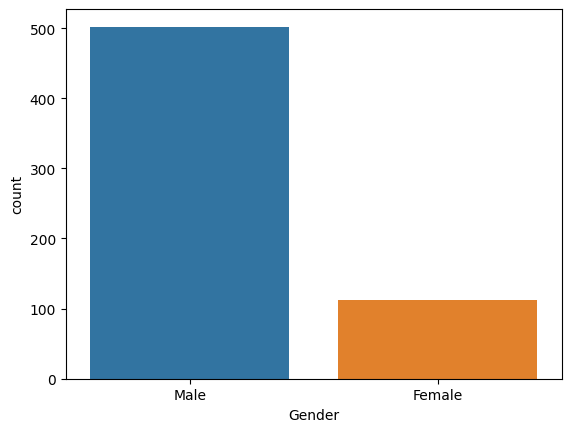

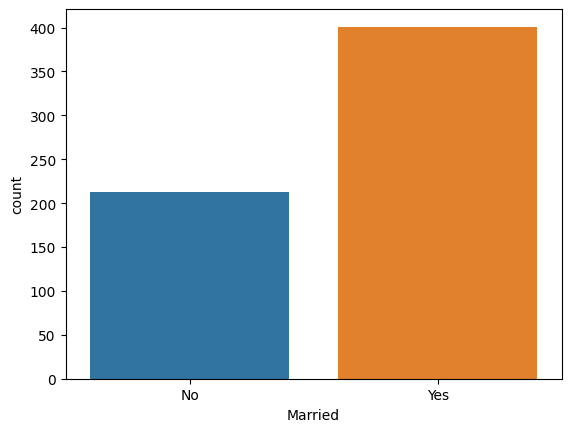

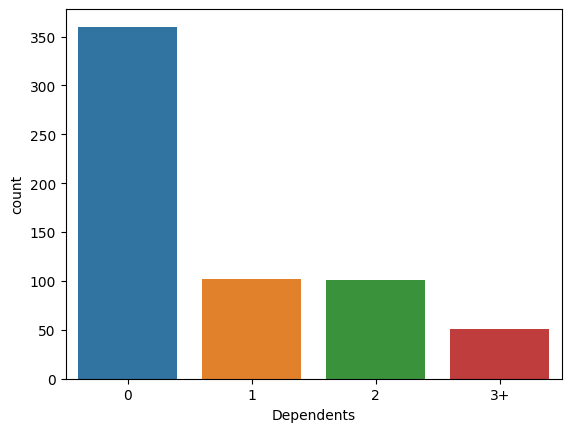

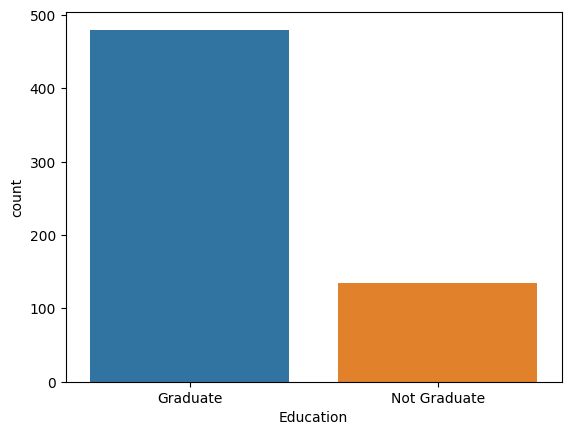

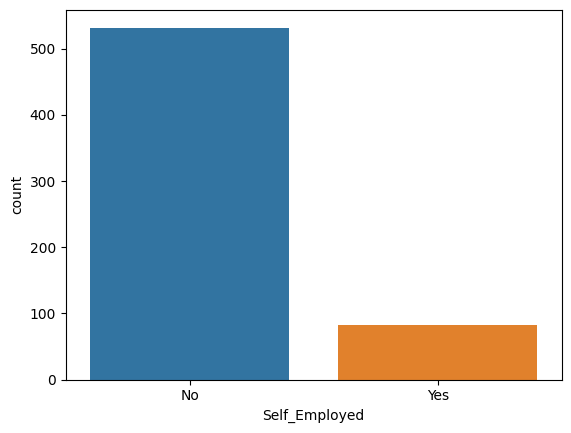

...

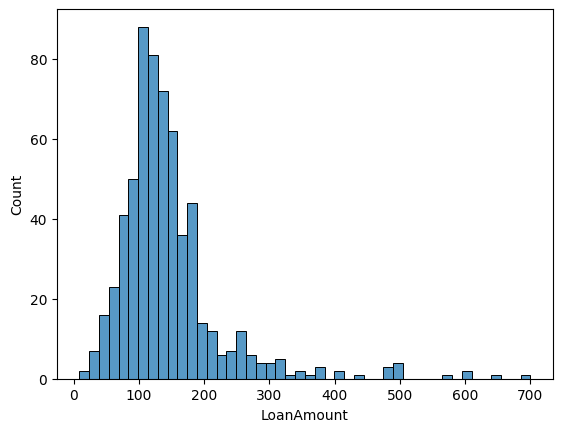

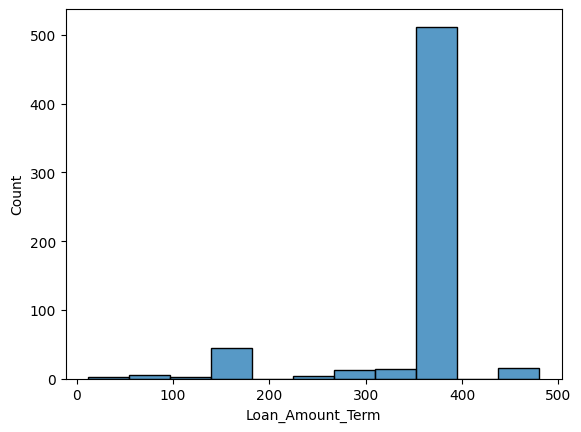

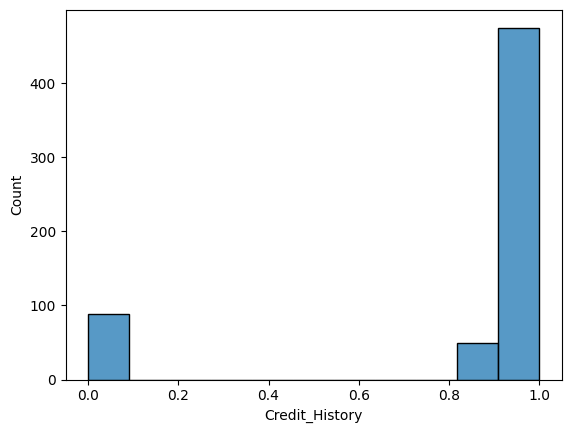

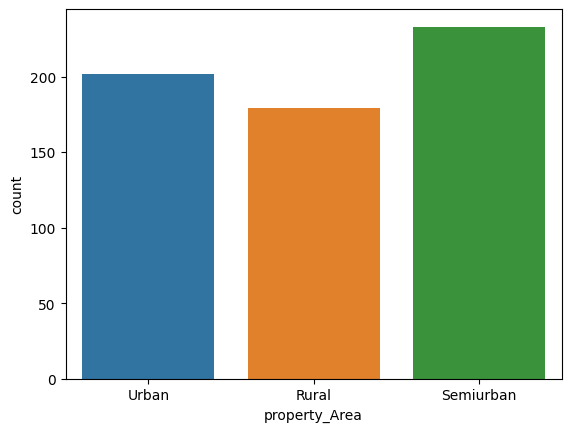

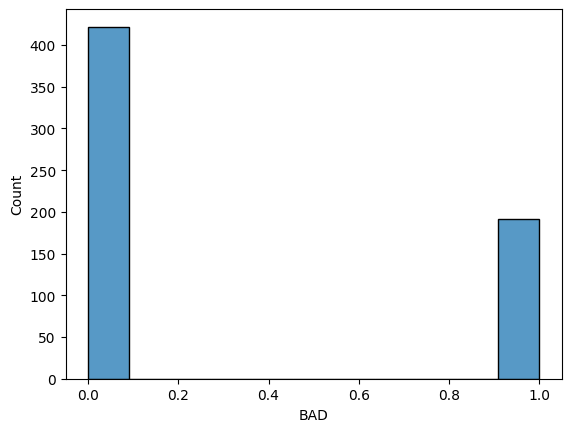

Dataframe 2 out of 4 Dataframes


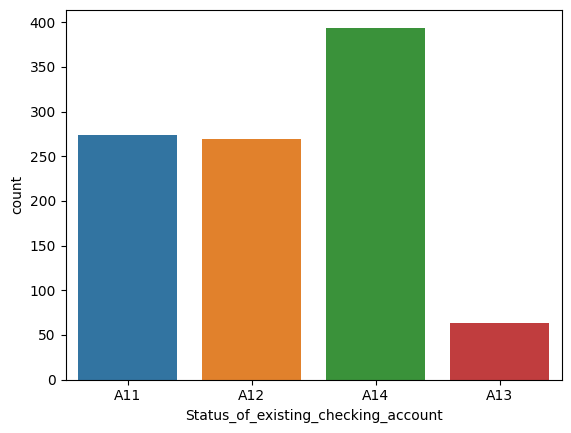

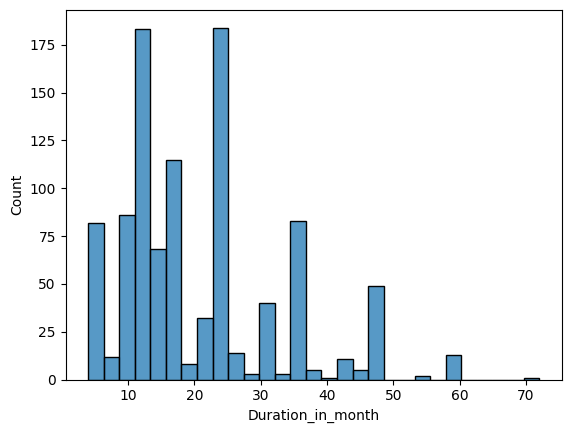

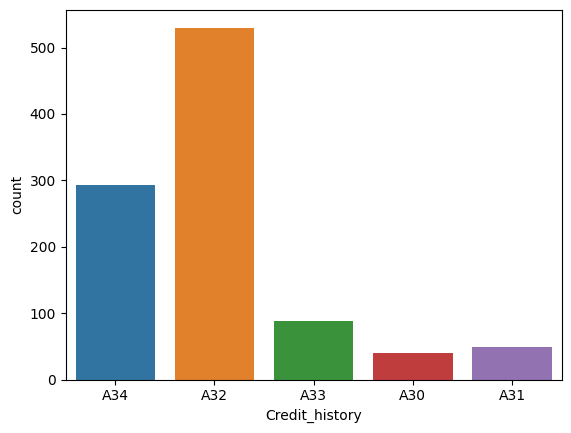

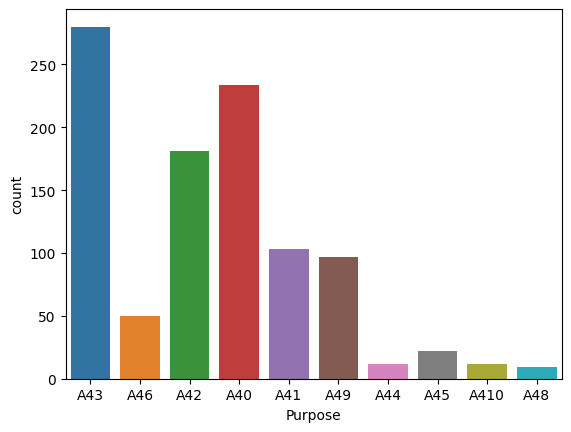

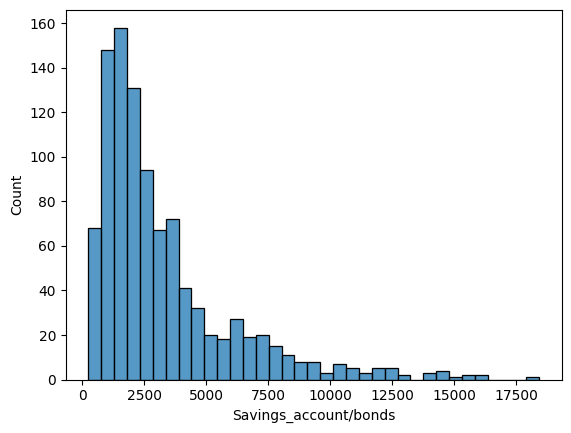

...

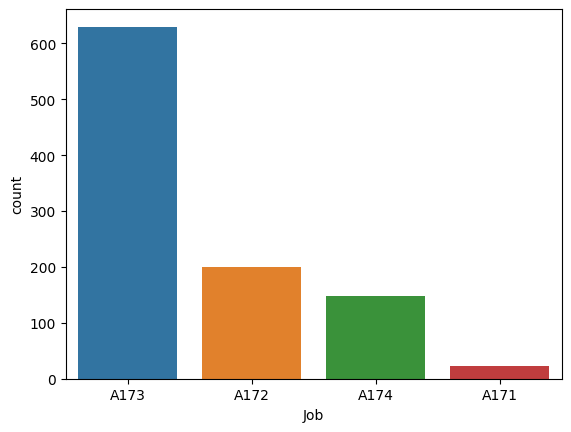

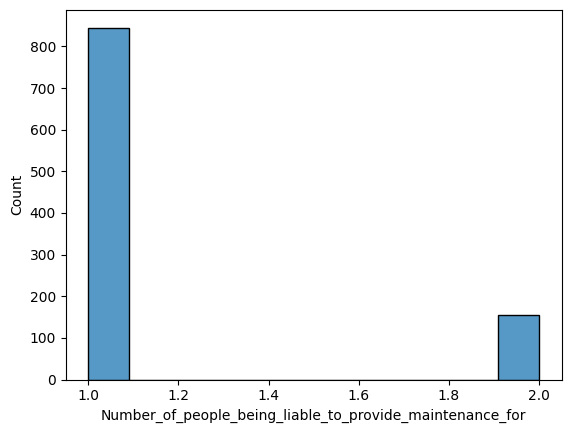

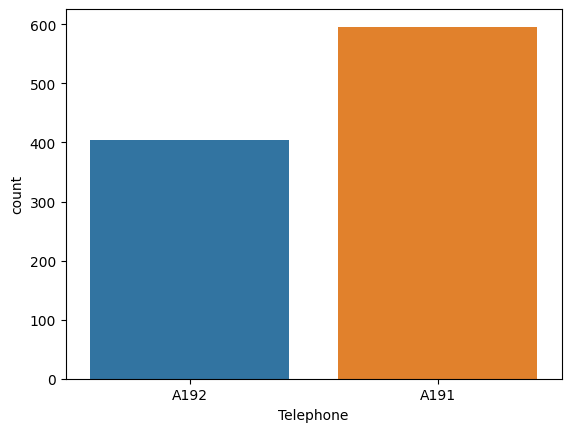

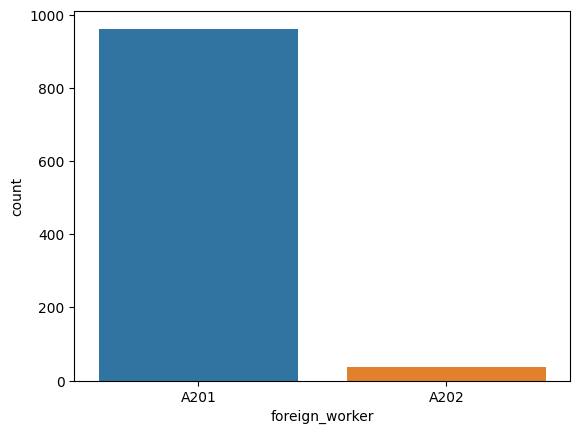

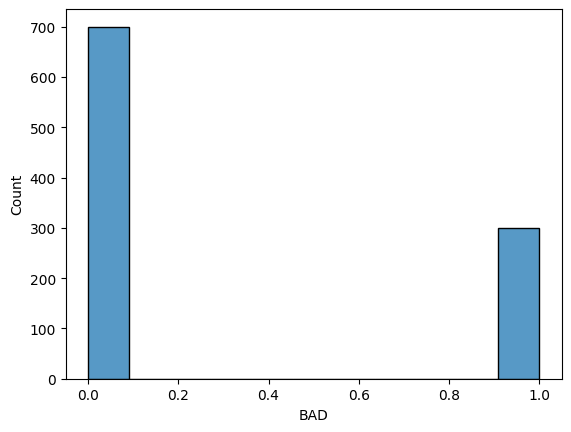

Dataframe 3 out of 4 Dataframes


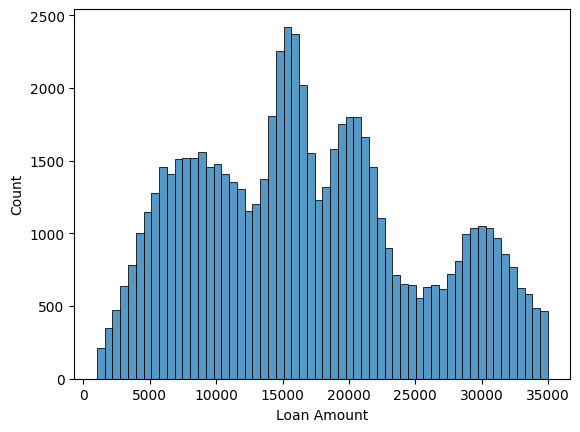

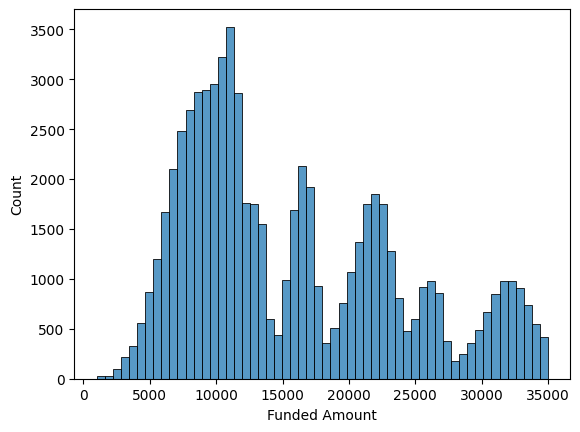

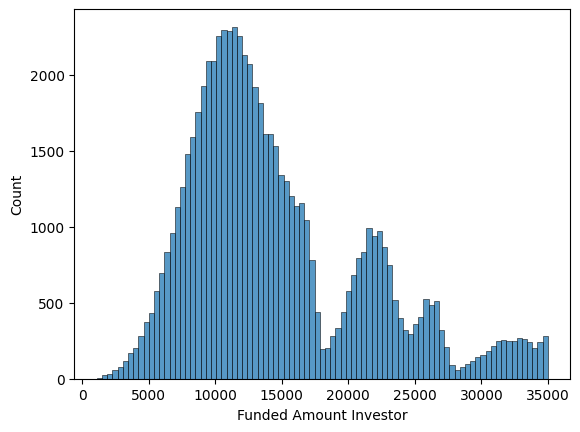

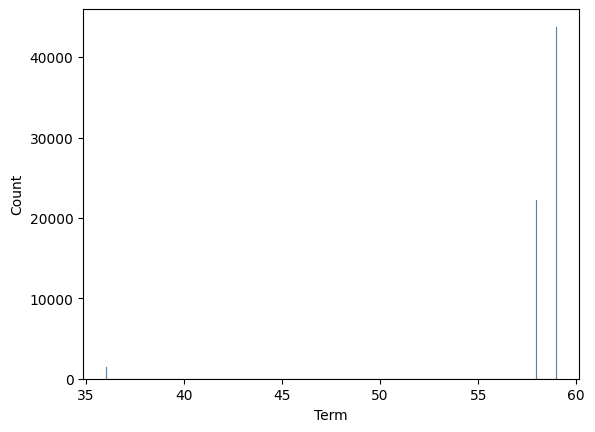

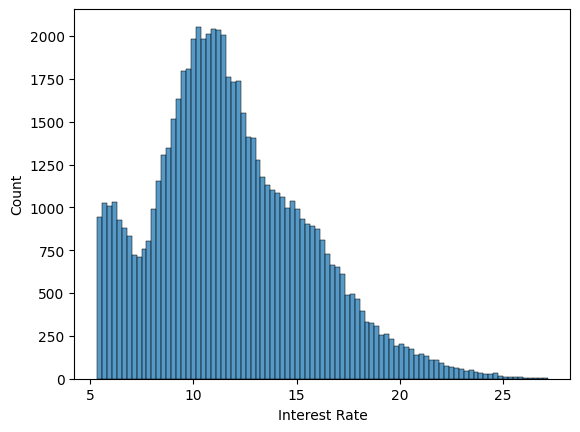

...

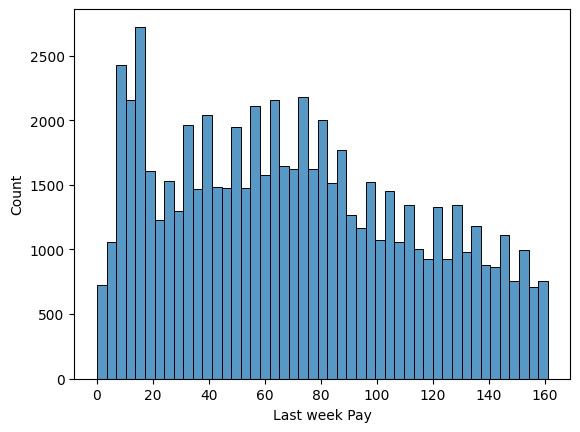

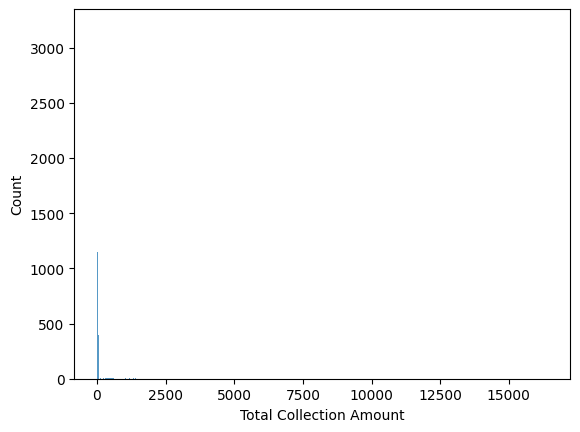

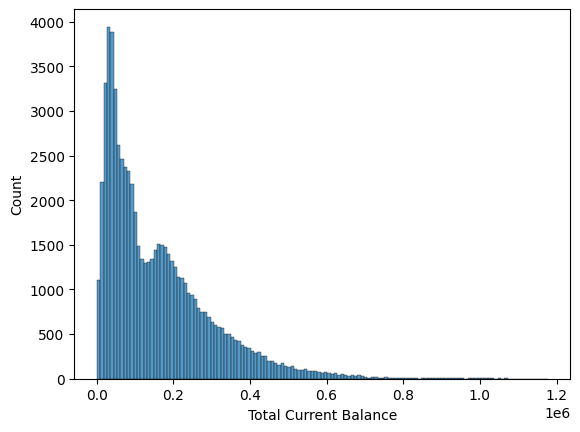

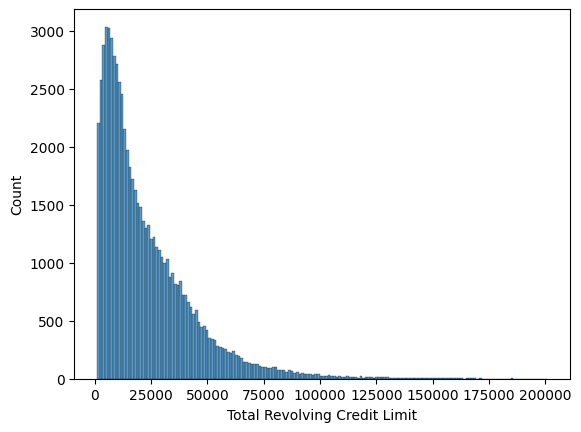

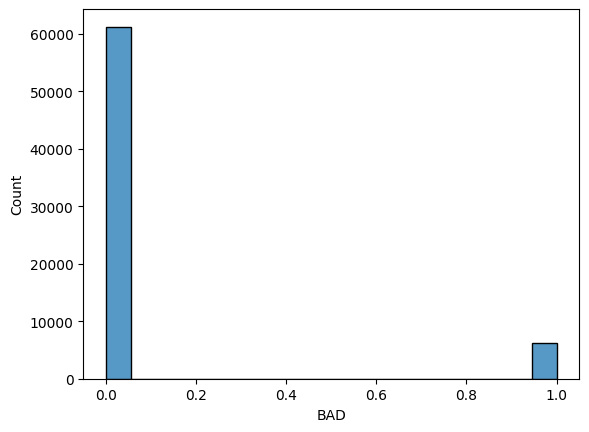

Dataframe 4 out of 4 Dataframes


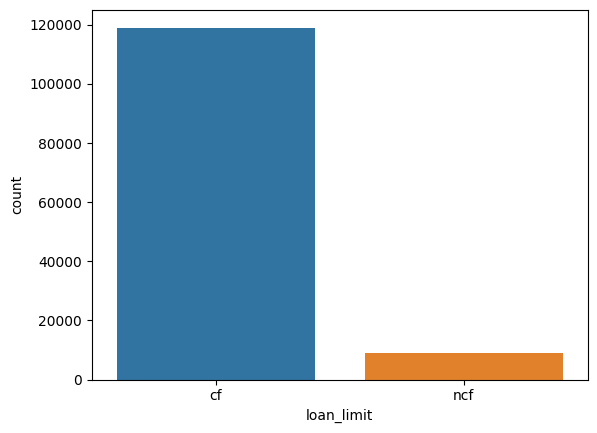

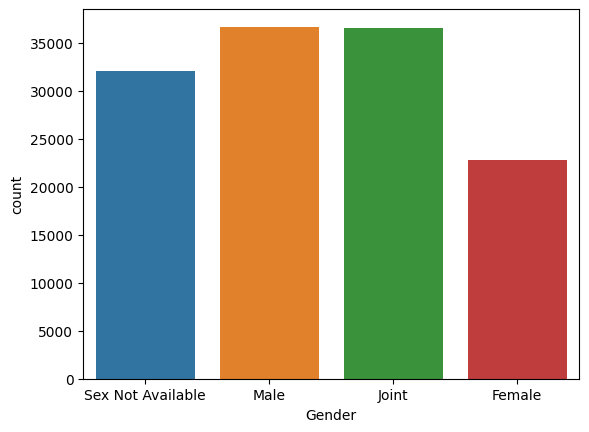

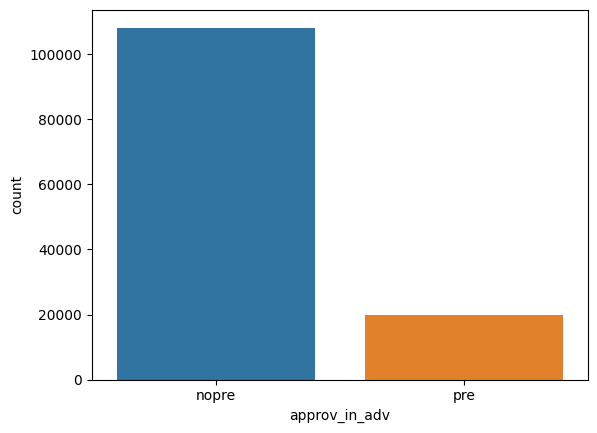

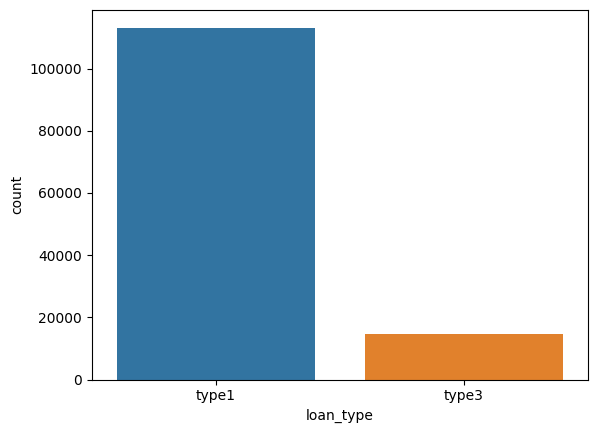

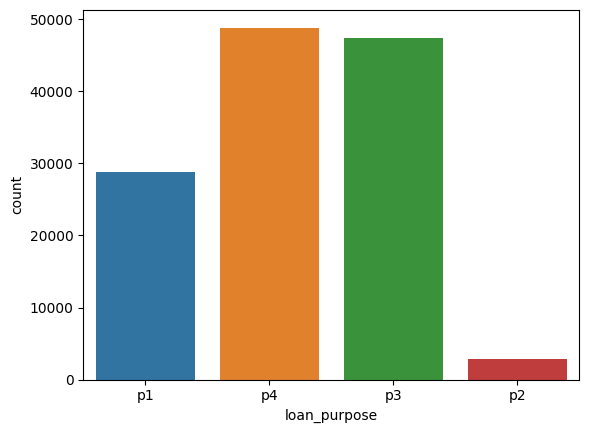

...

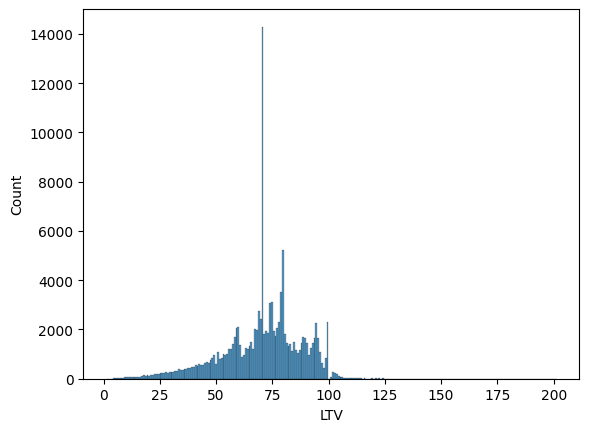

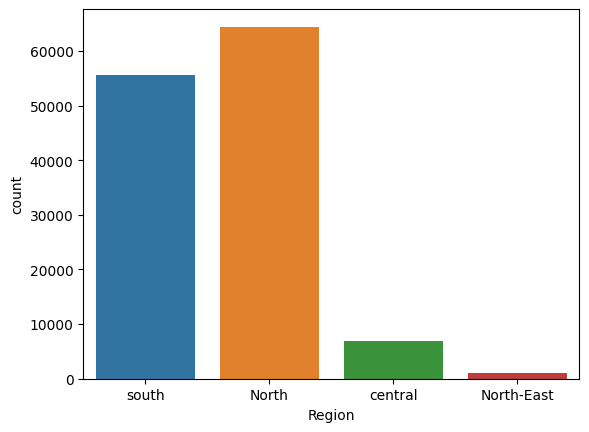

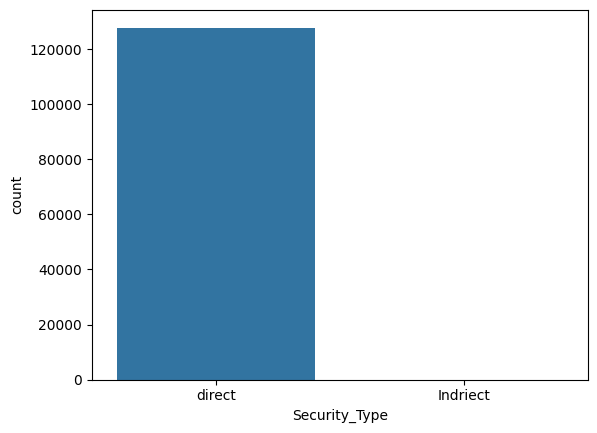

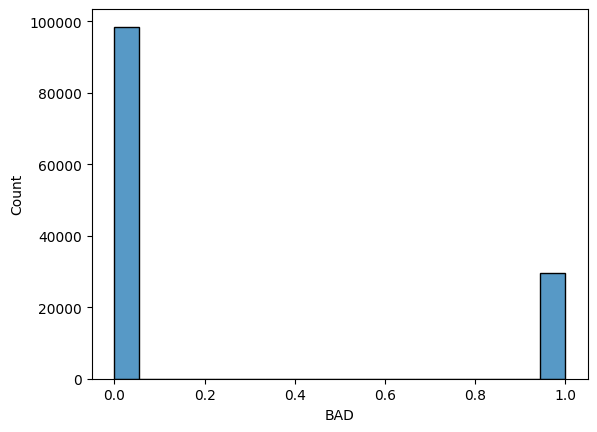

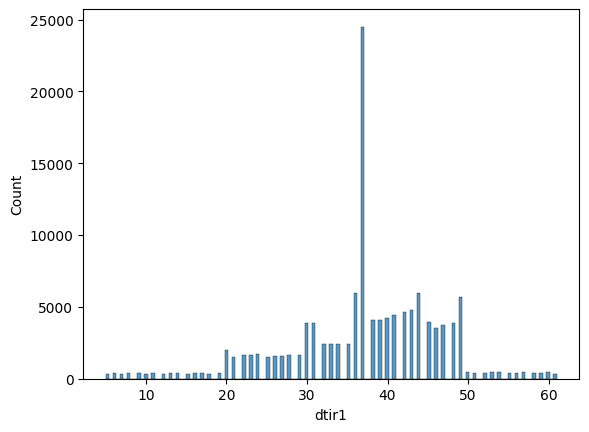

In [ ]:
# Plot original data
simulation_demonstration(df_list, simulations, plot_original=True)

Dataframe 1 out of 4 Dataframes


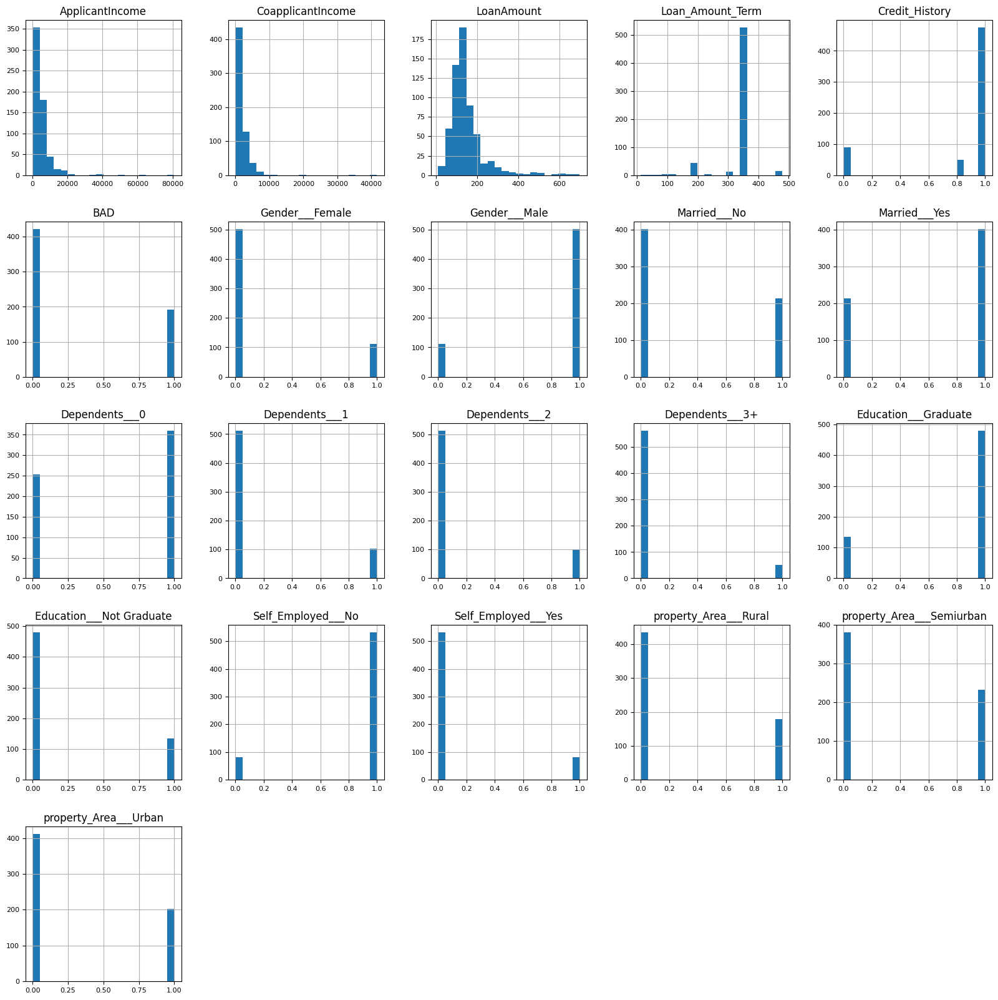

Dataframe 2 out of 4 Dataframes


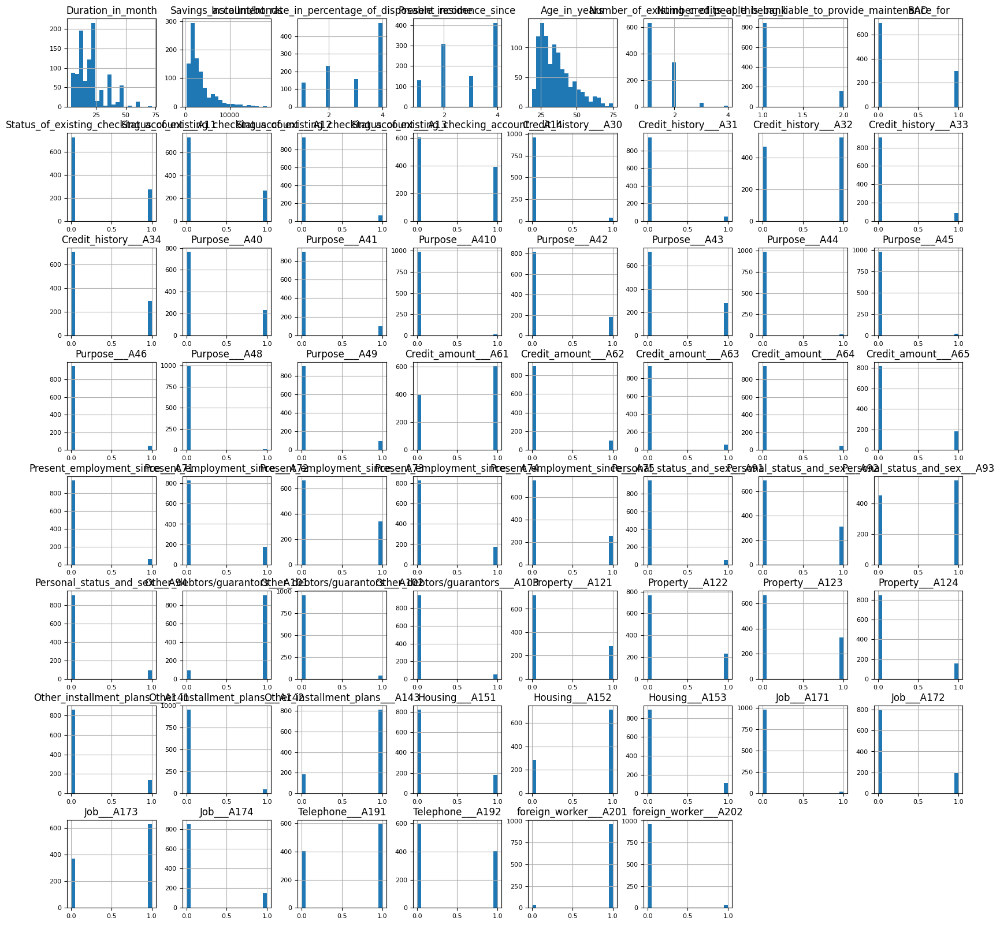

Dataframe 3 out of 4 Dataframes


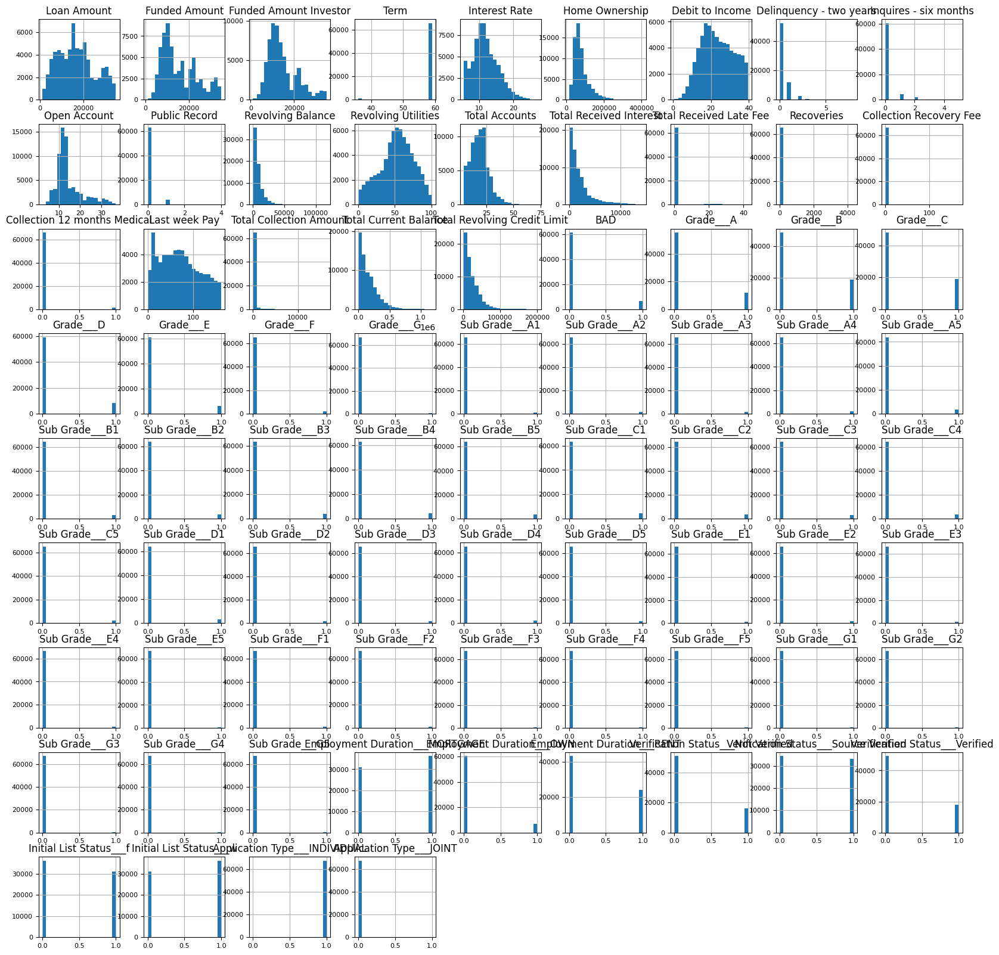

Dataframe 4 out of 4 Dataframes


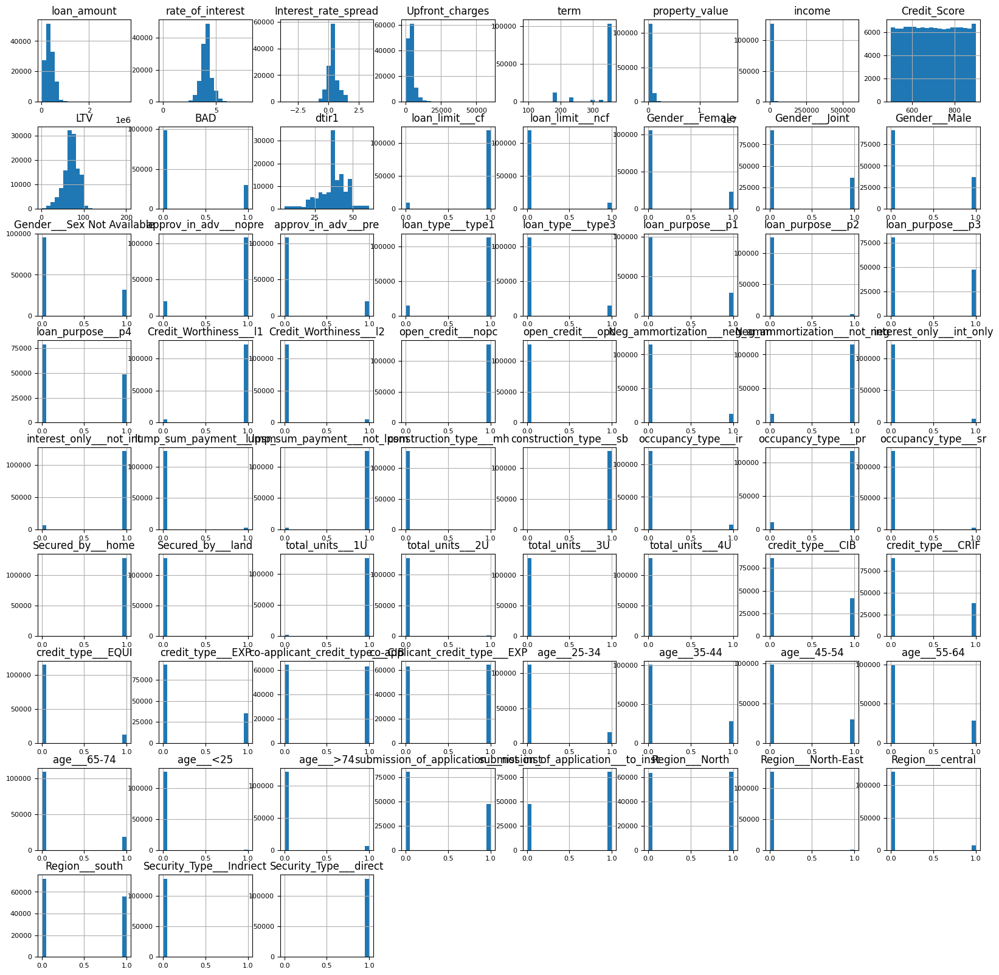

In [ ]:
# Plot dummified data
simulation_demonstration(df_list, simulations, plot_dummied=True)

Dataframe 1 out of 4 Dataframes


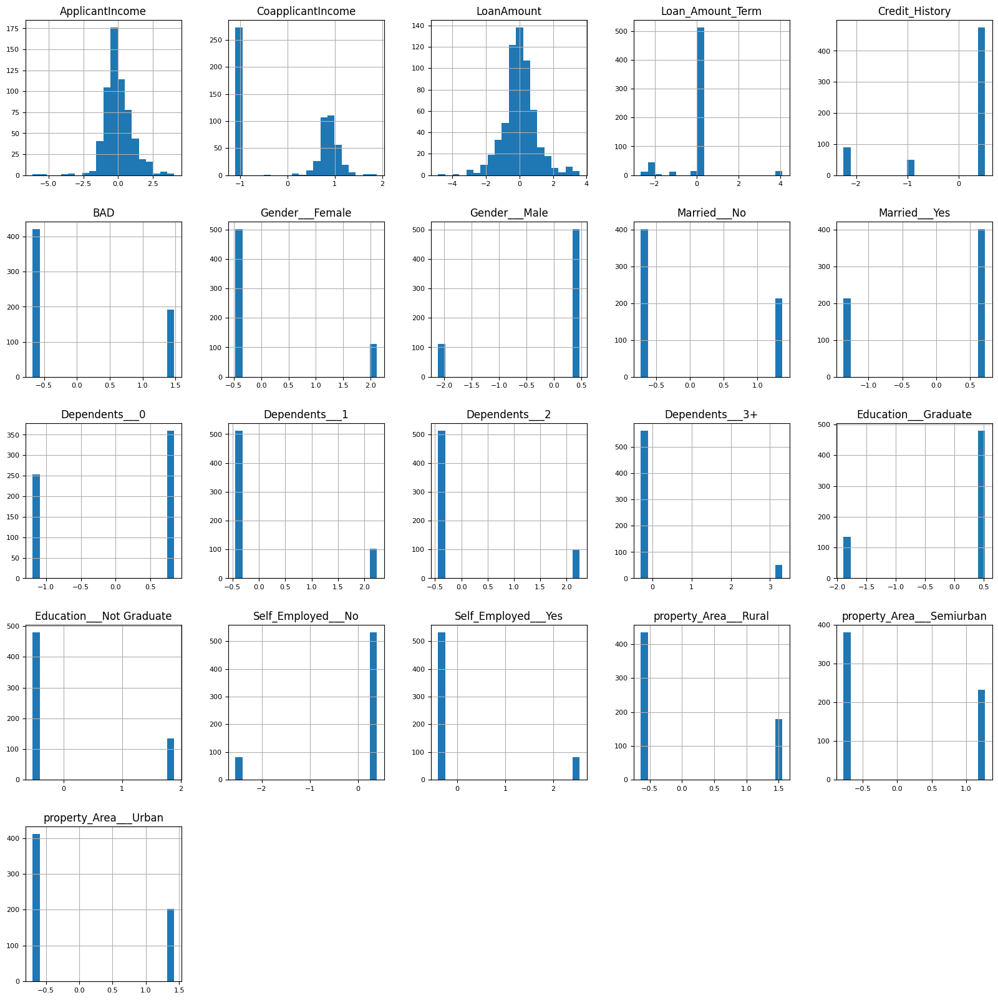

Dataframe 2 out of 4 Dataframes


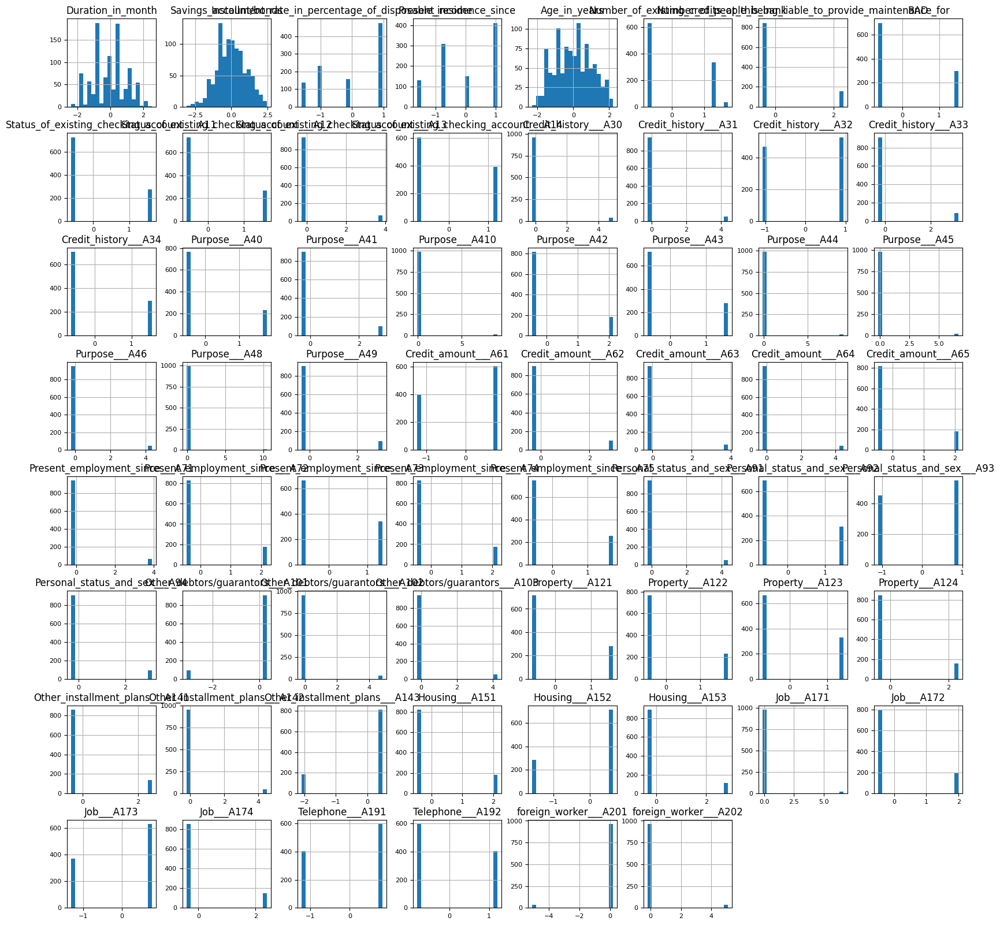

Dataframe 3 out of 4 Dataframes


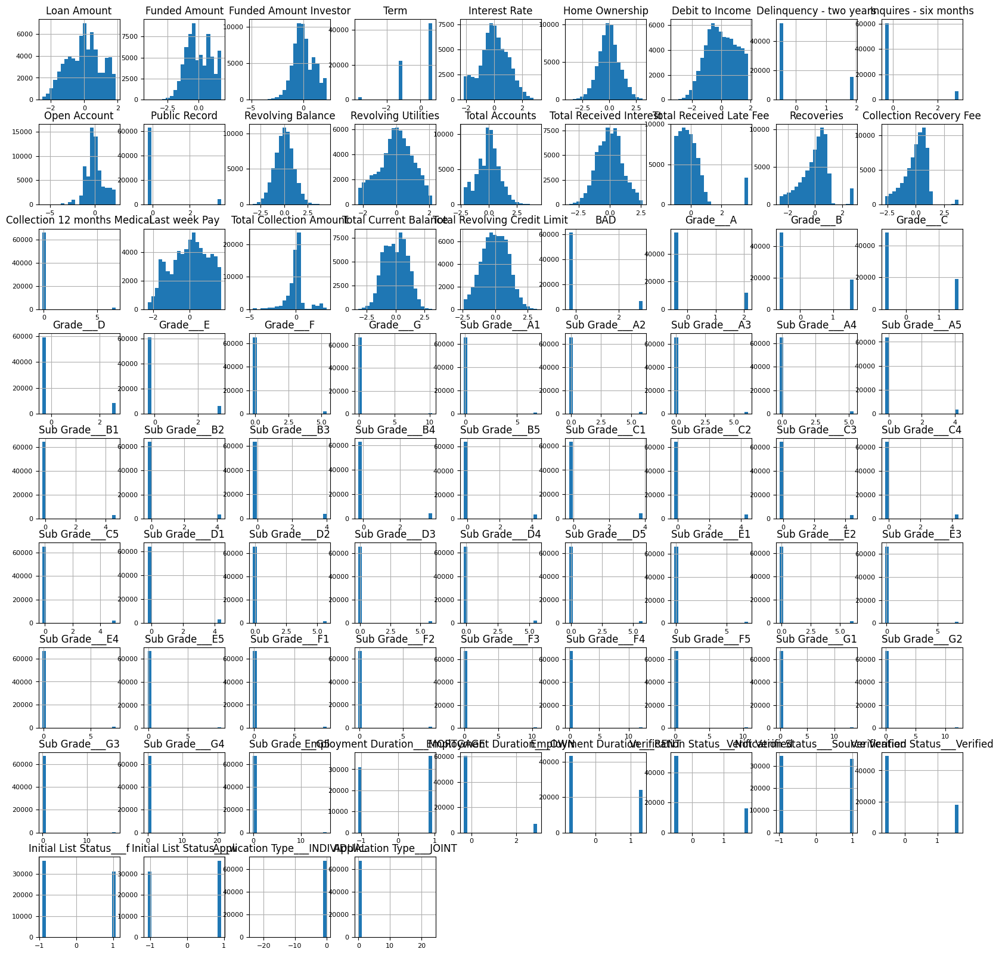

Dataframe 4 out of 4 Dataframes


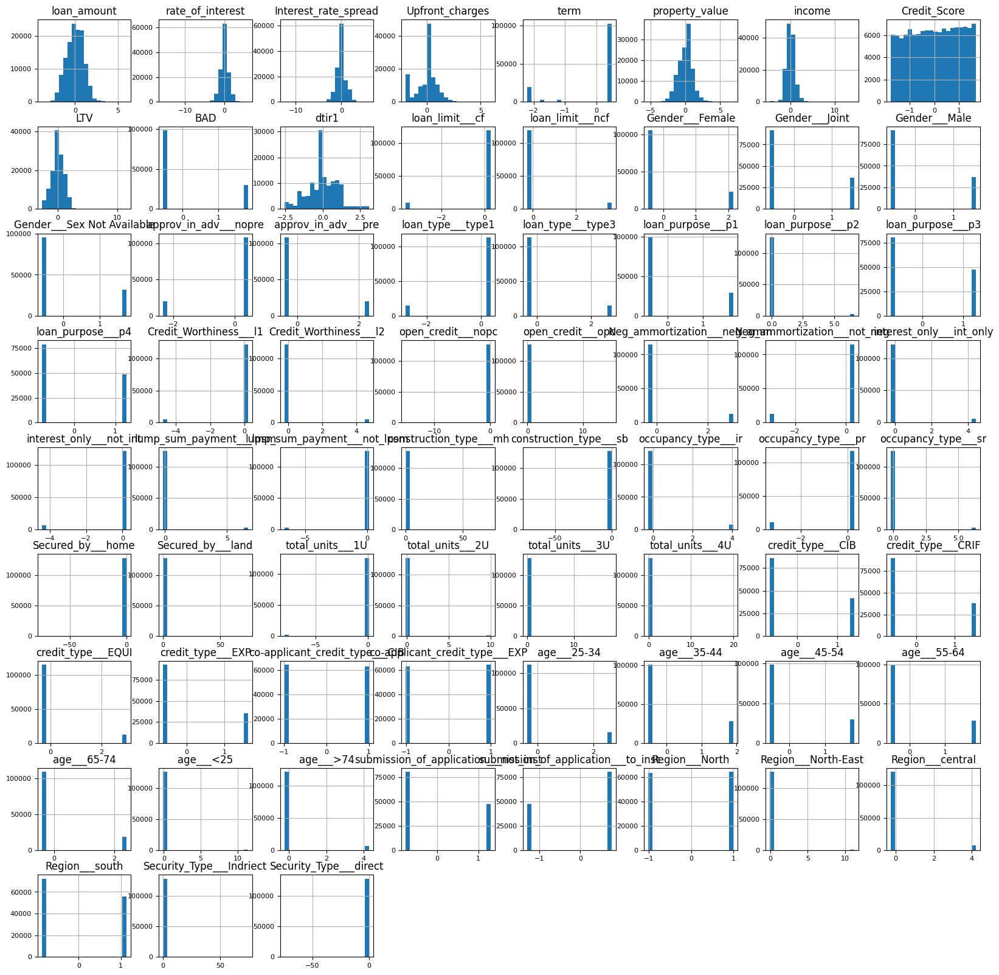

In [ ]:
# Plot transformed data
simulation_demonstration(df_list, simulations, plot_transformed=True)

Dataframe 1 out of 4 Dataframes
1000Simulations


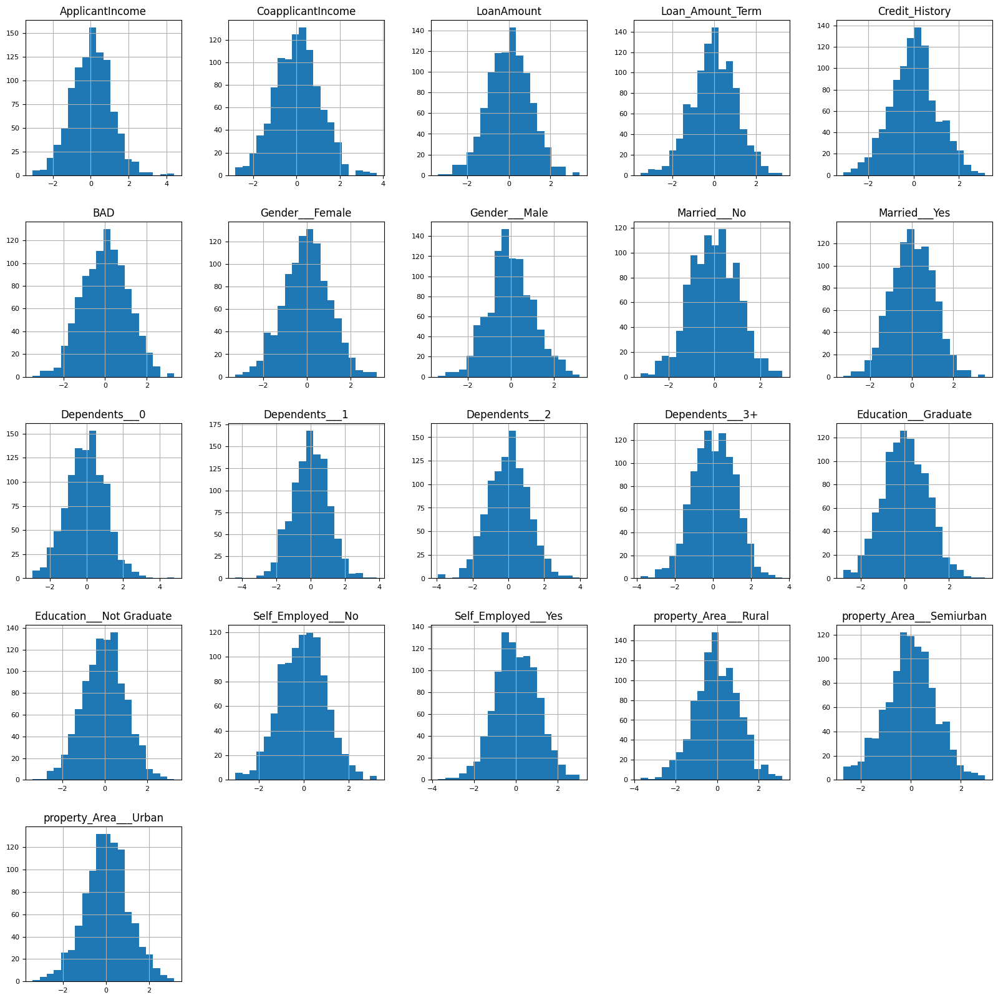

10000Simulations


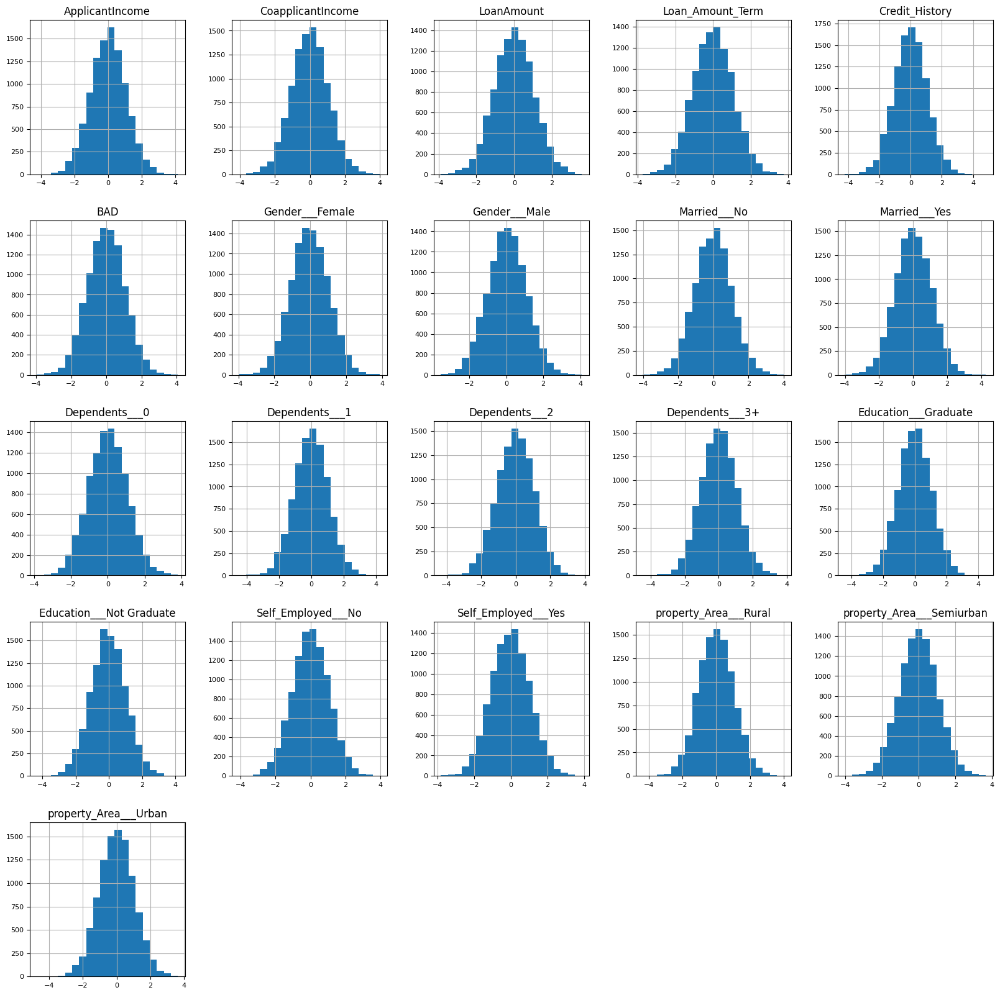

100000Simulations


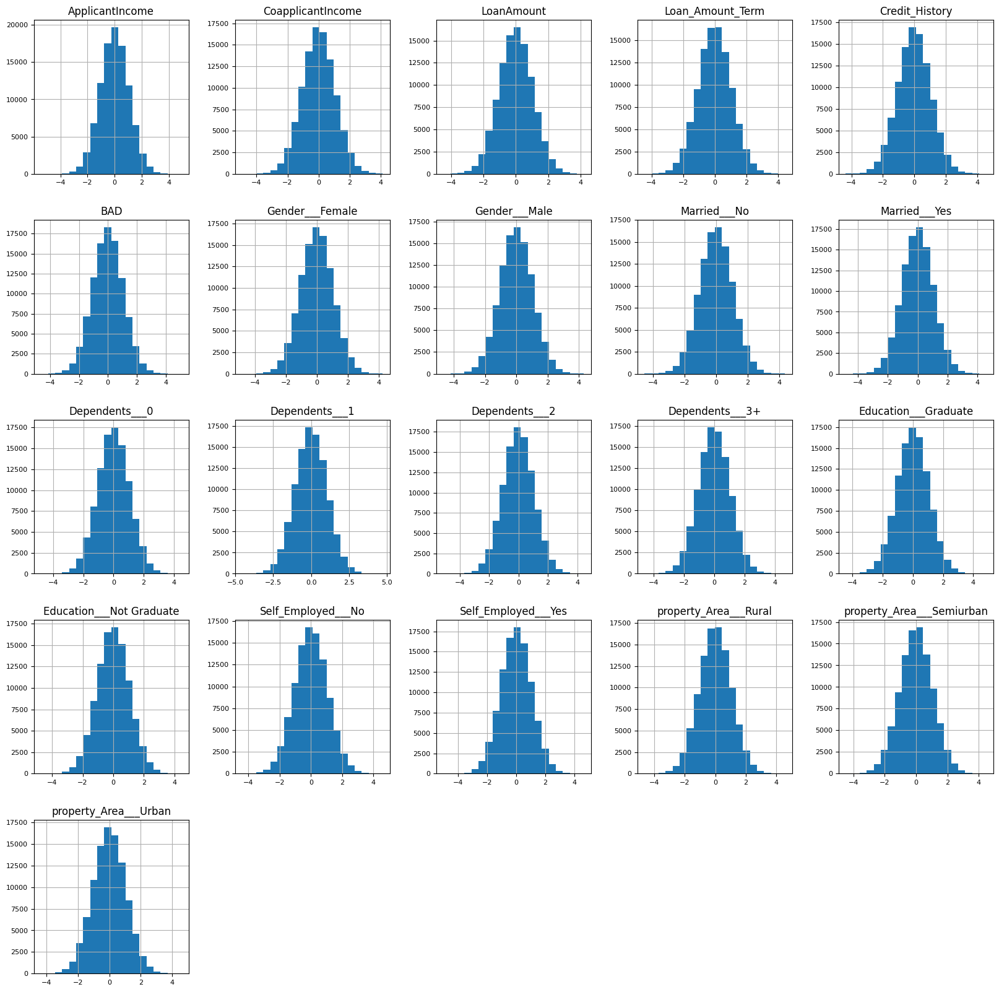

1000000Simulations


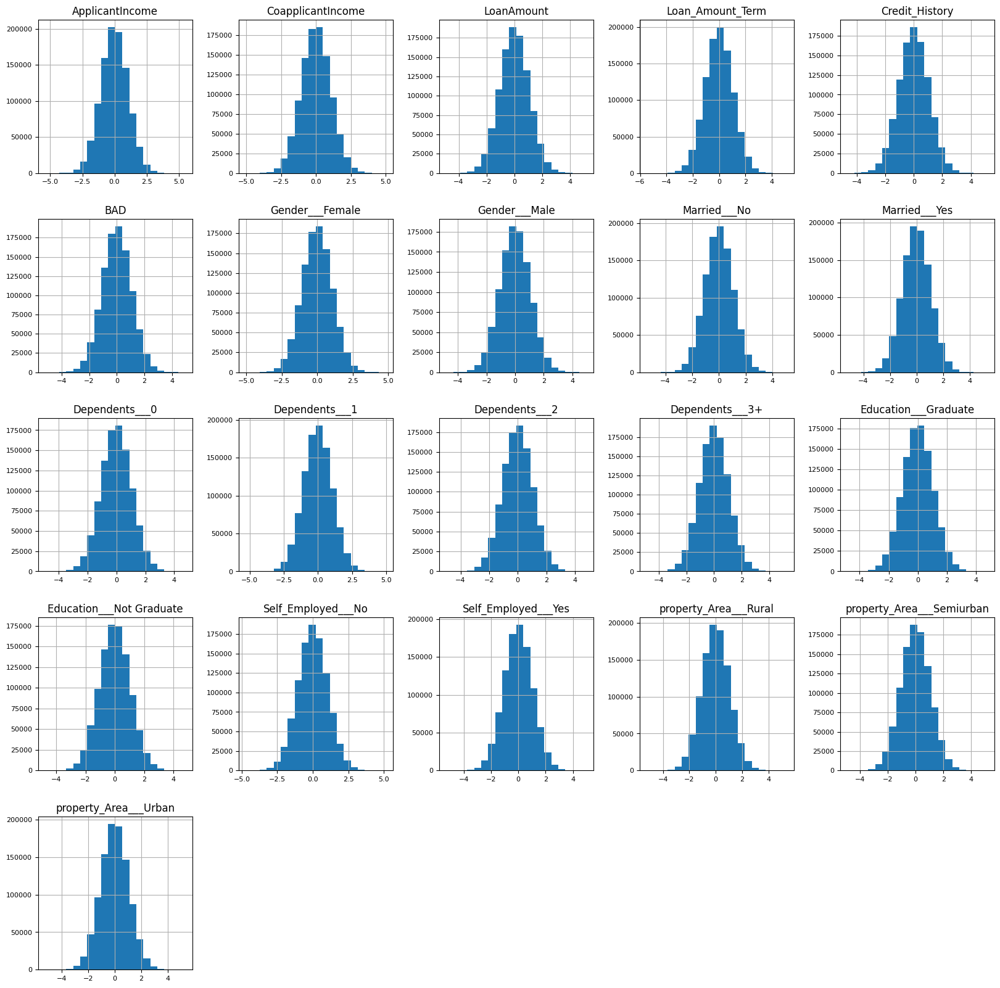

Dataframe 2 out of 4 Dataframes
1000Simulations


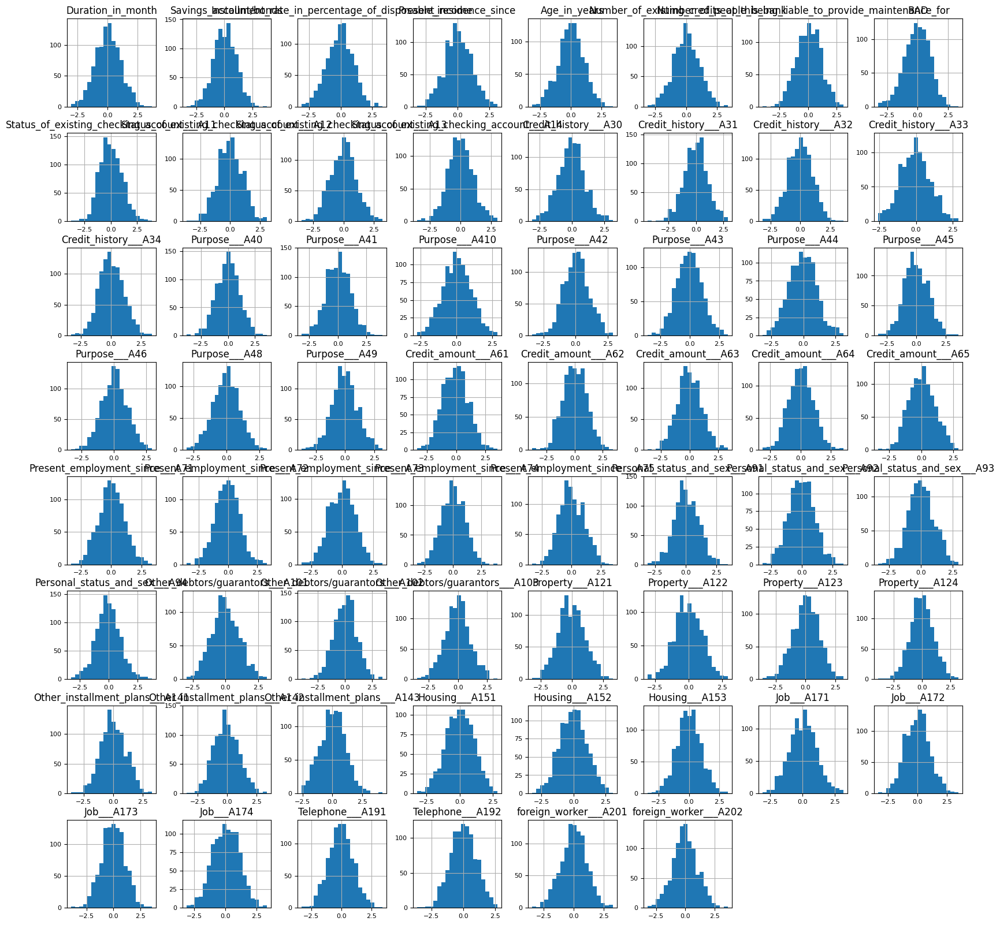

10000Simulations


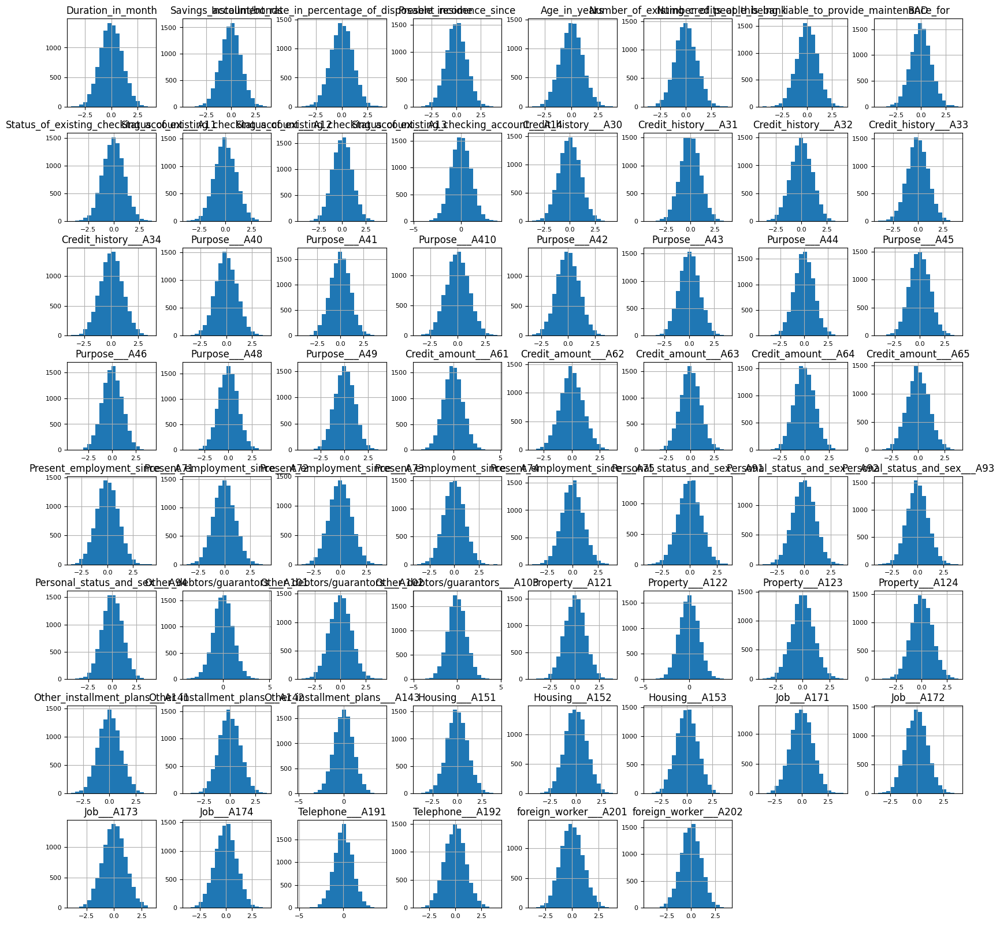

100000Simulations


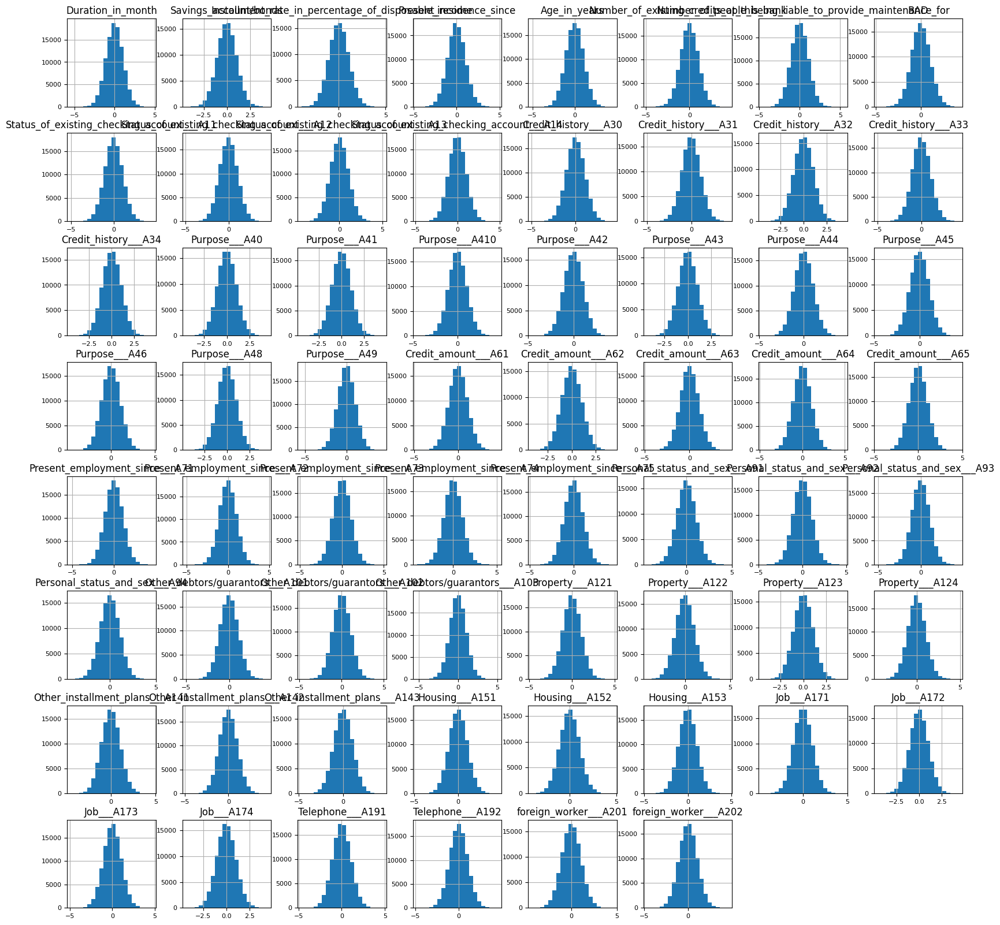

1000000Simulations


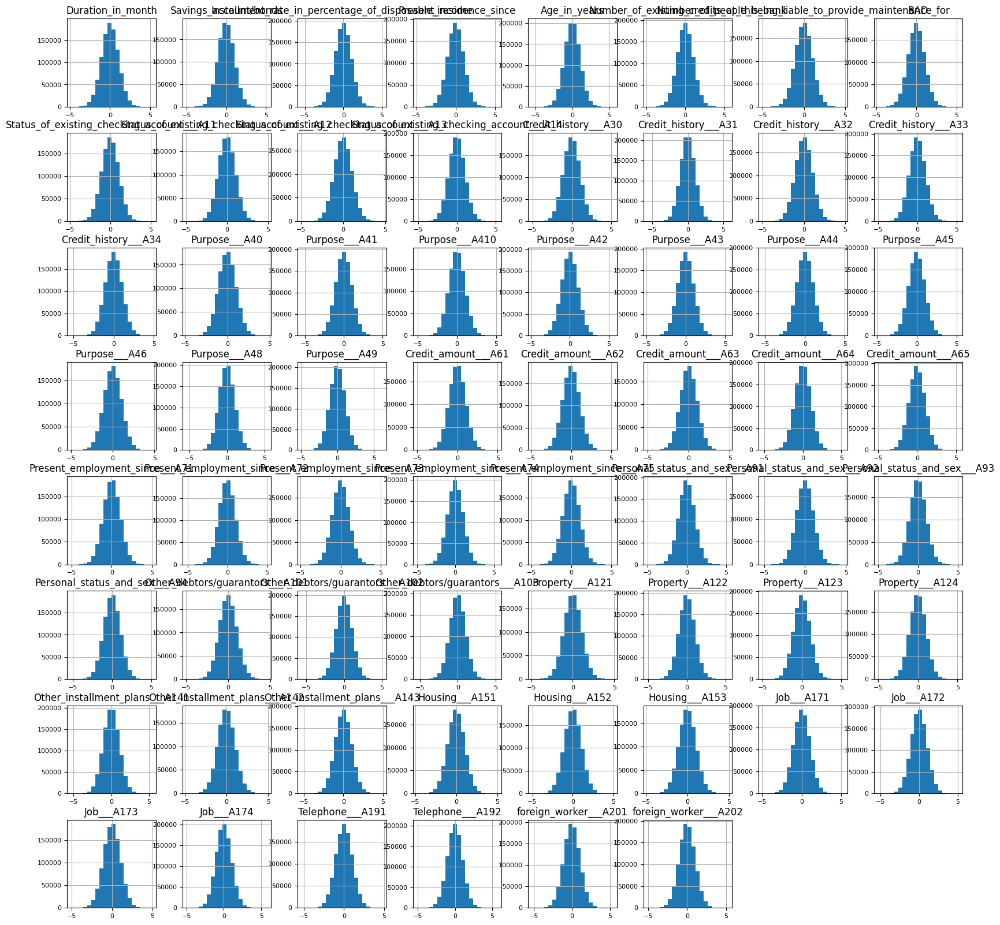

Dataframe 3 out of 4 Dataframes
1000Simulations


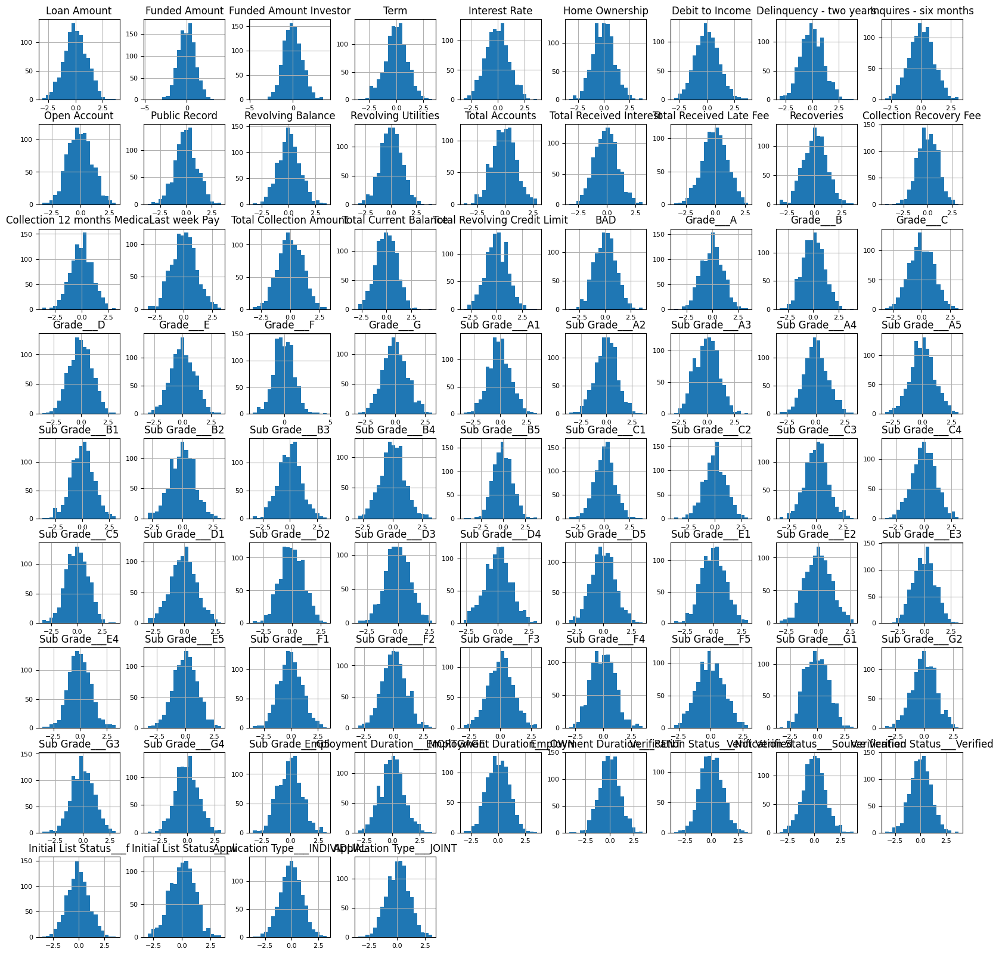

10000Simulations


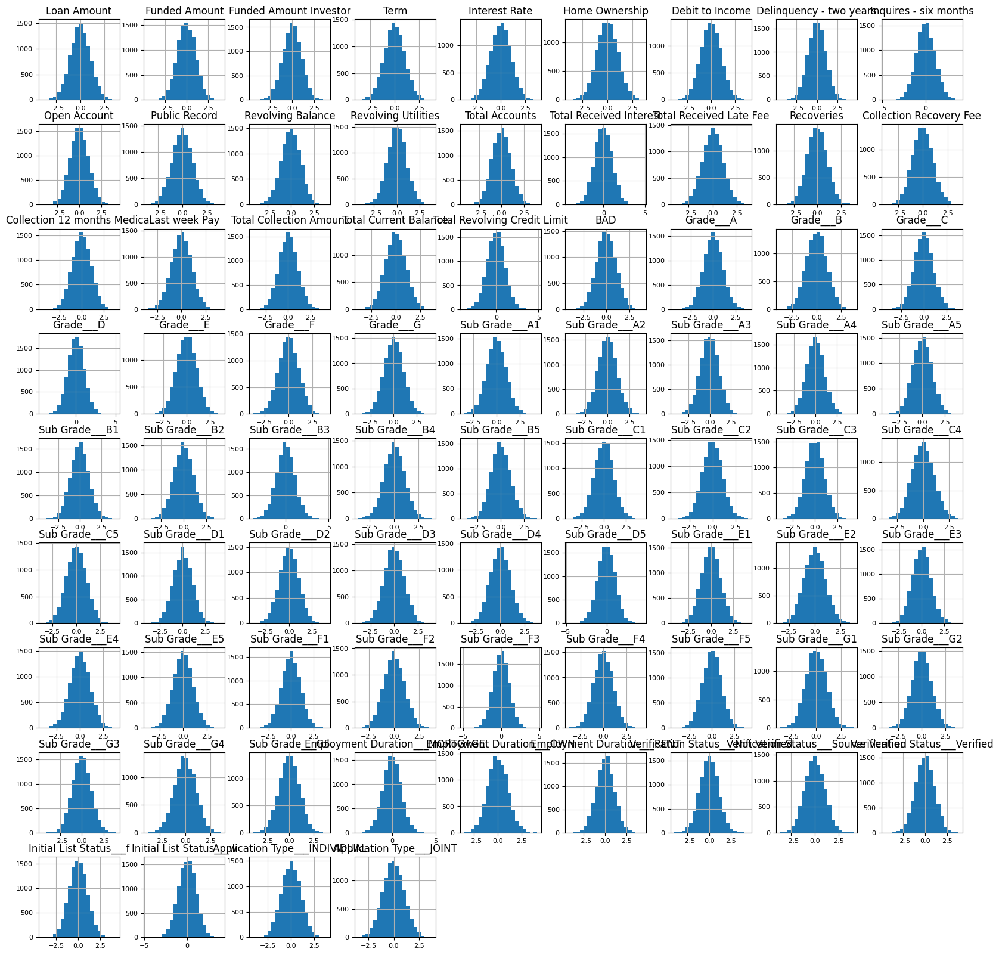

100000Simulations


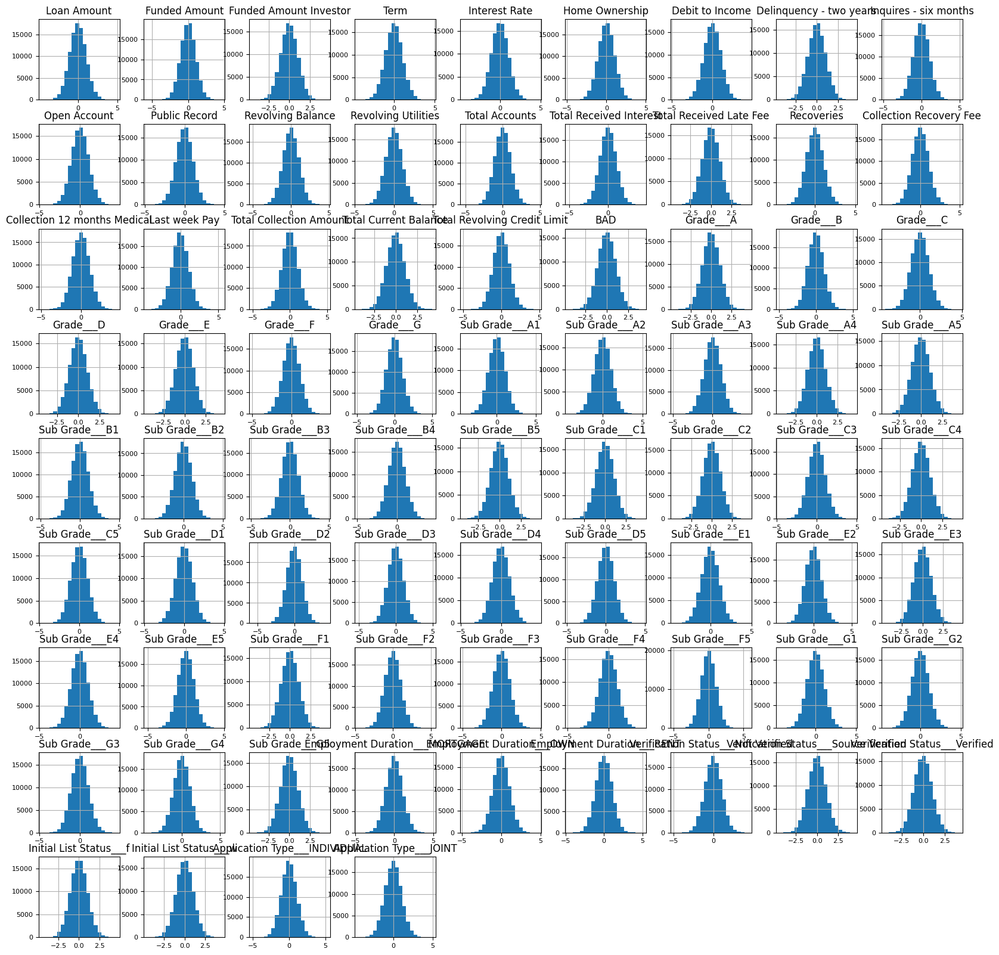

1000000Simulations


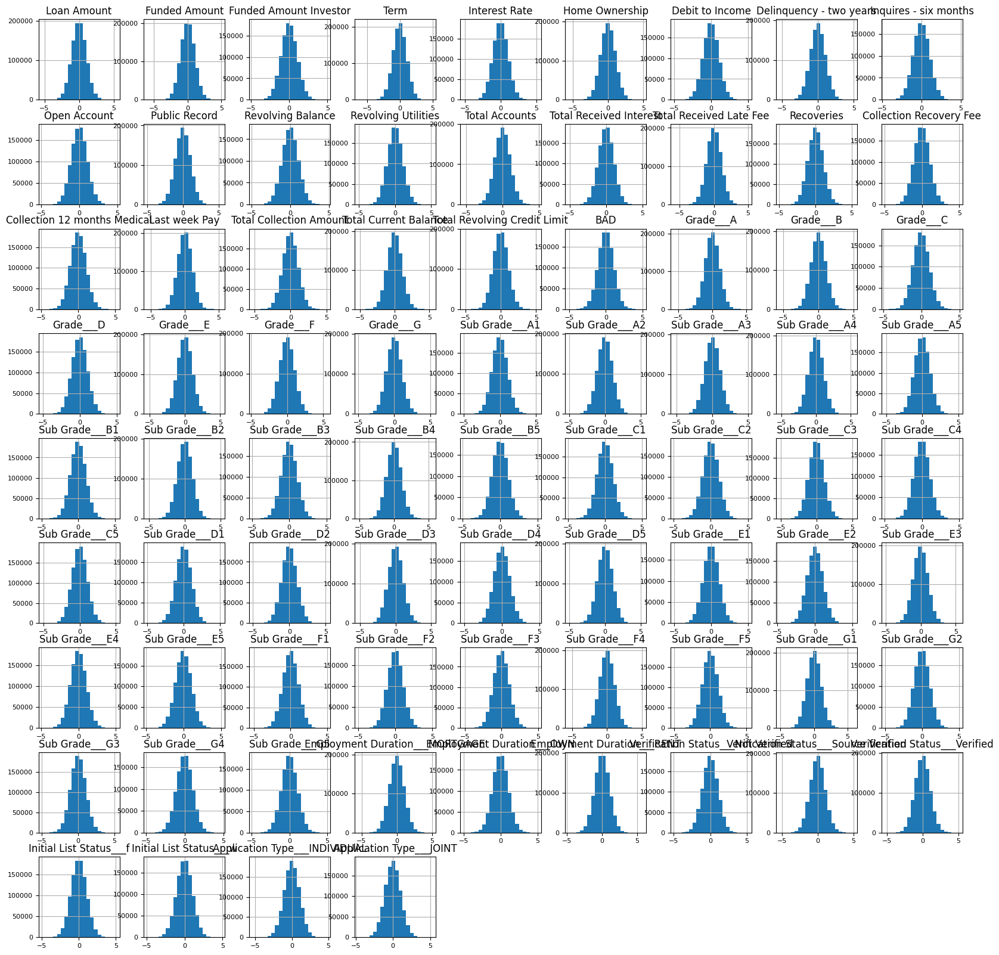

Dataframe 4 out of 4 Dataframes
1000Simulations


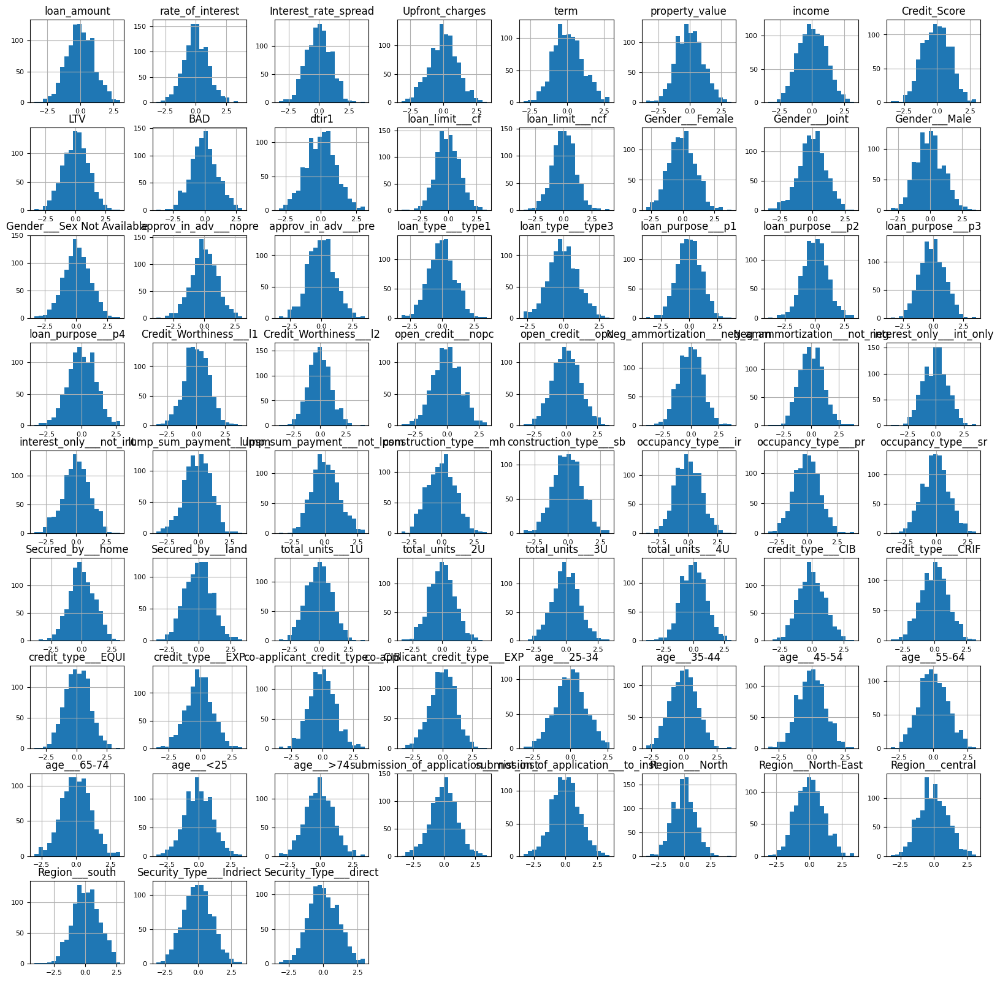

10000Simulations


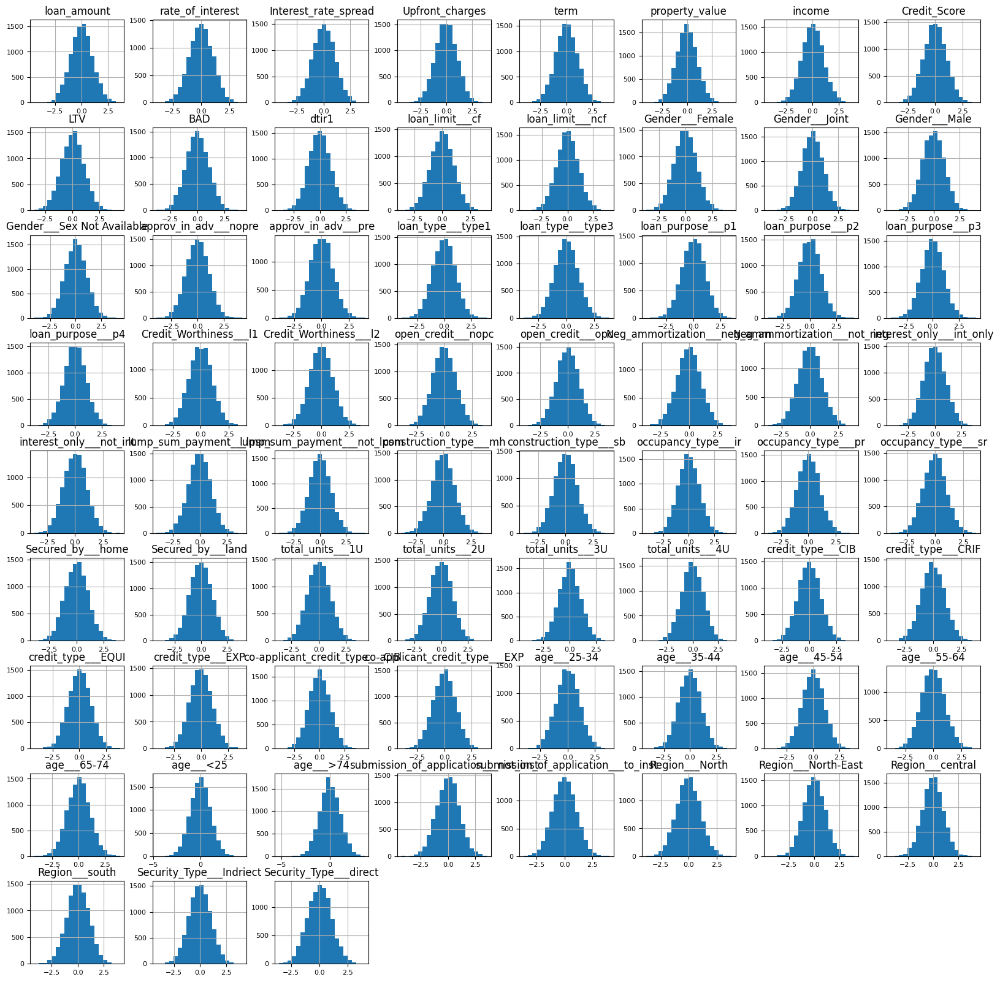

100000Simulations


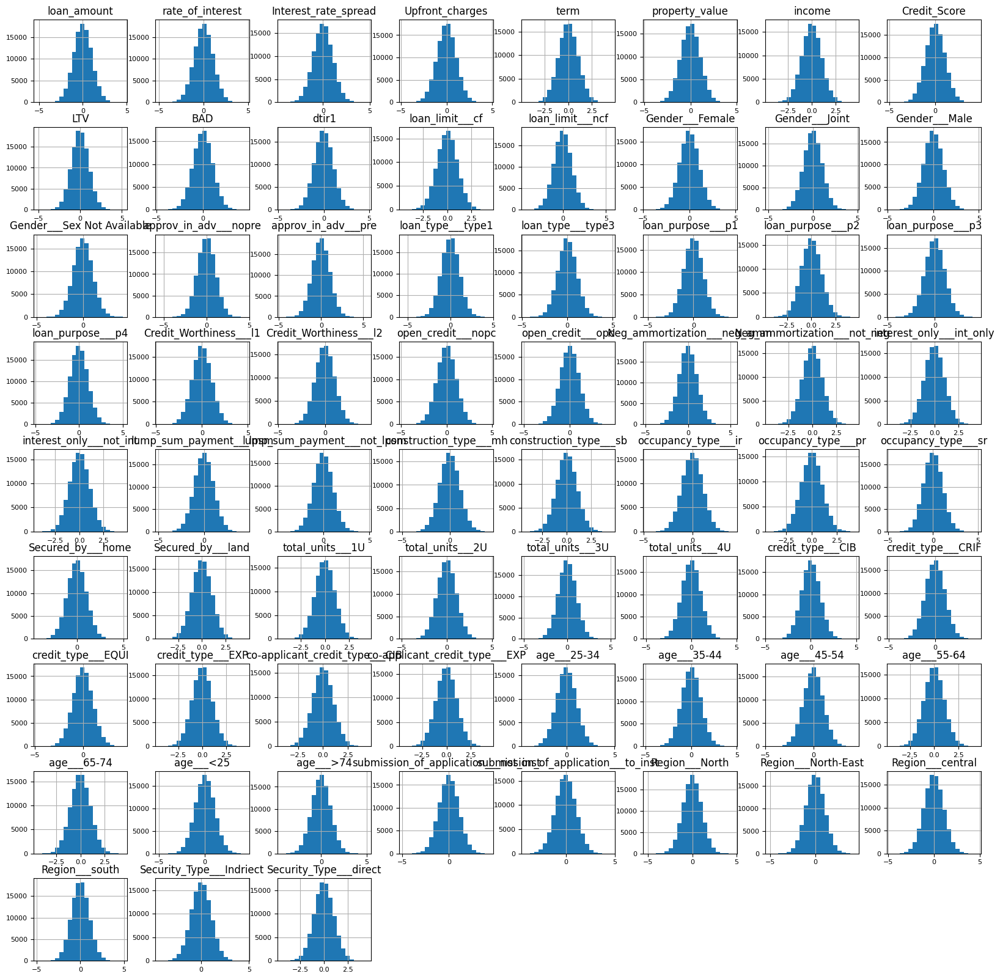

1000000Simulations


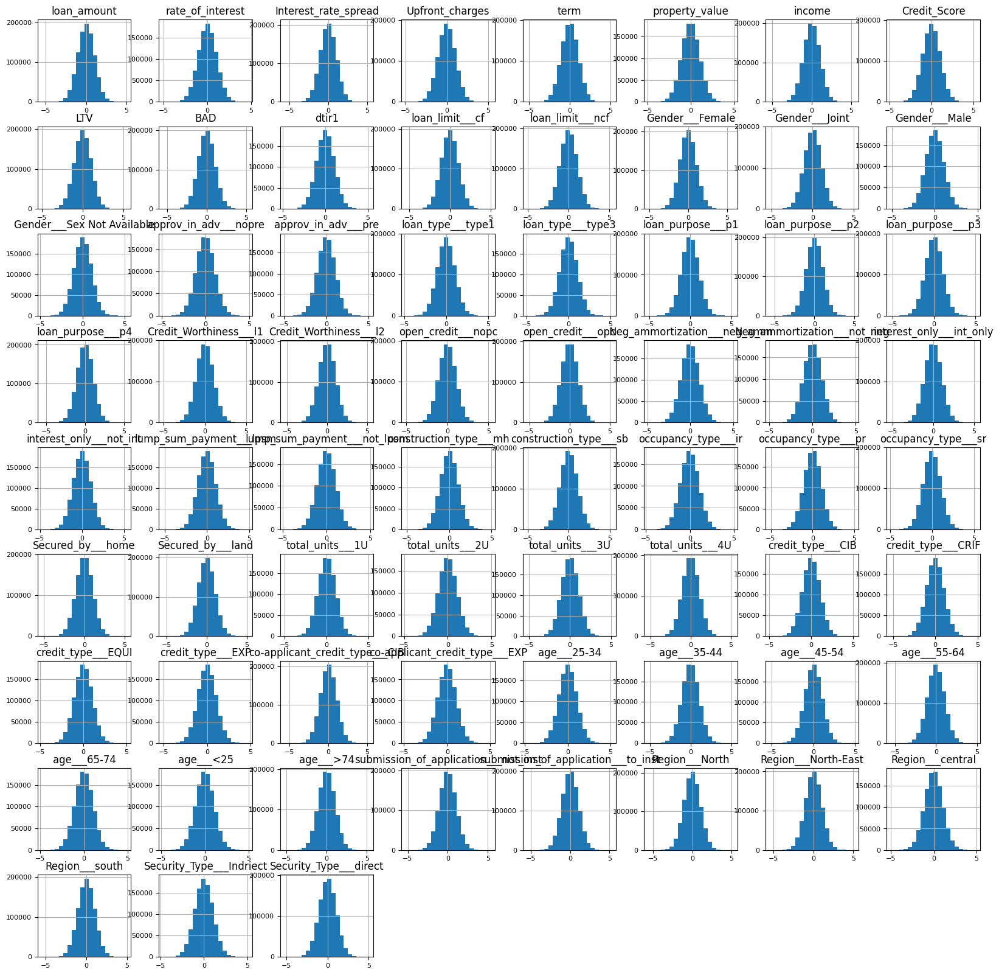

In [ ]:
# Plot simulated data 
simulation_demonstration(df_list, simulations, plot_transformed_simulation=True)

Dataframe 1 out of 4 Dataframes
1000Simulations


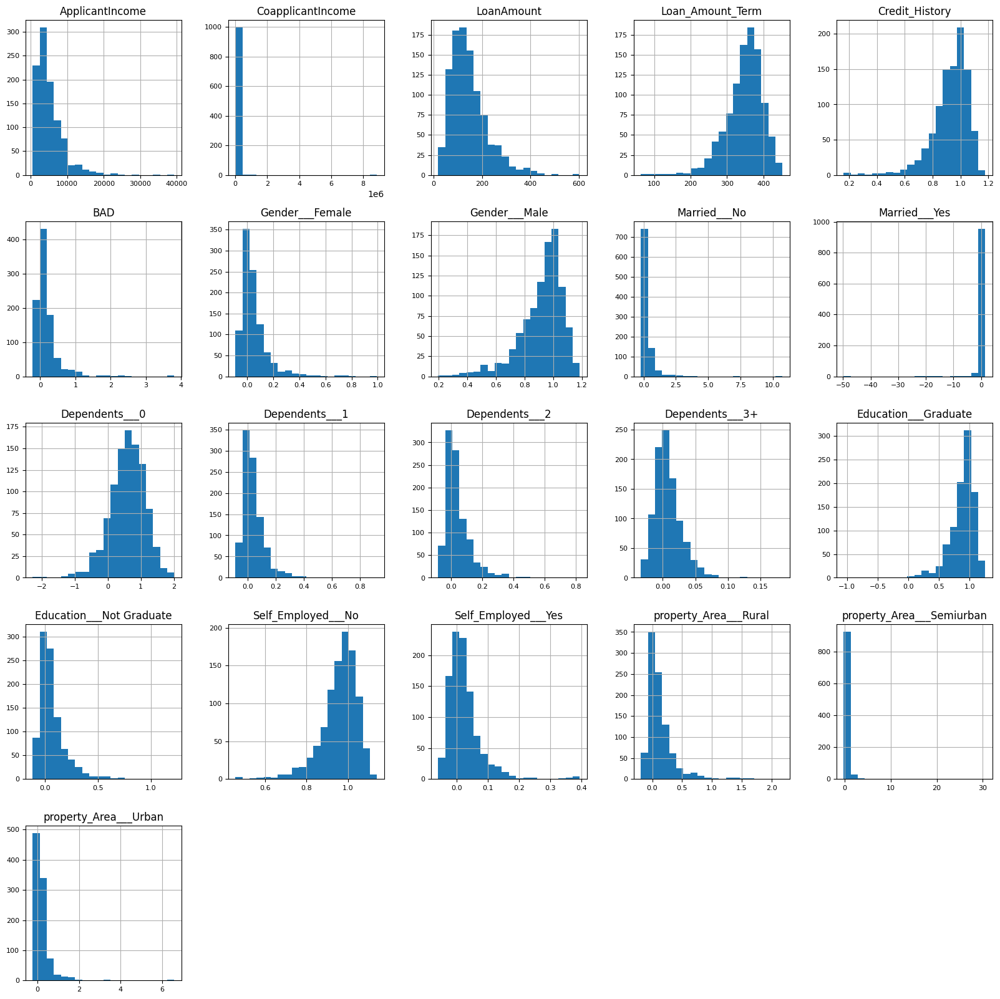

10000Simulations


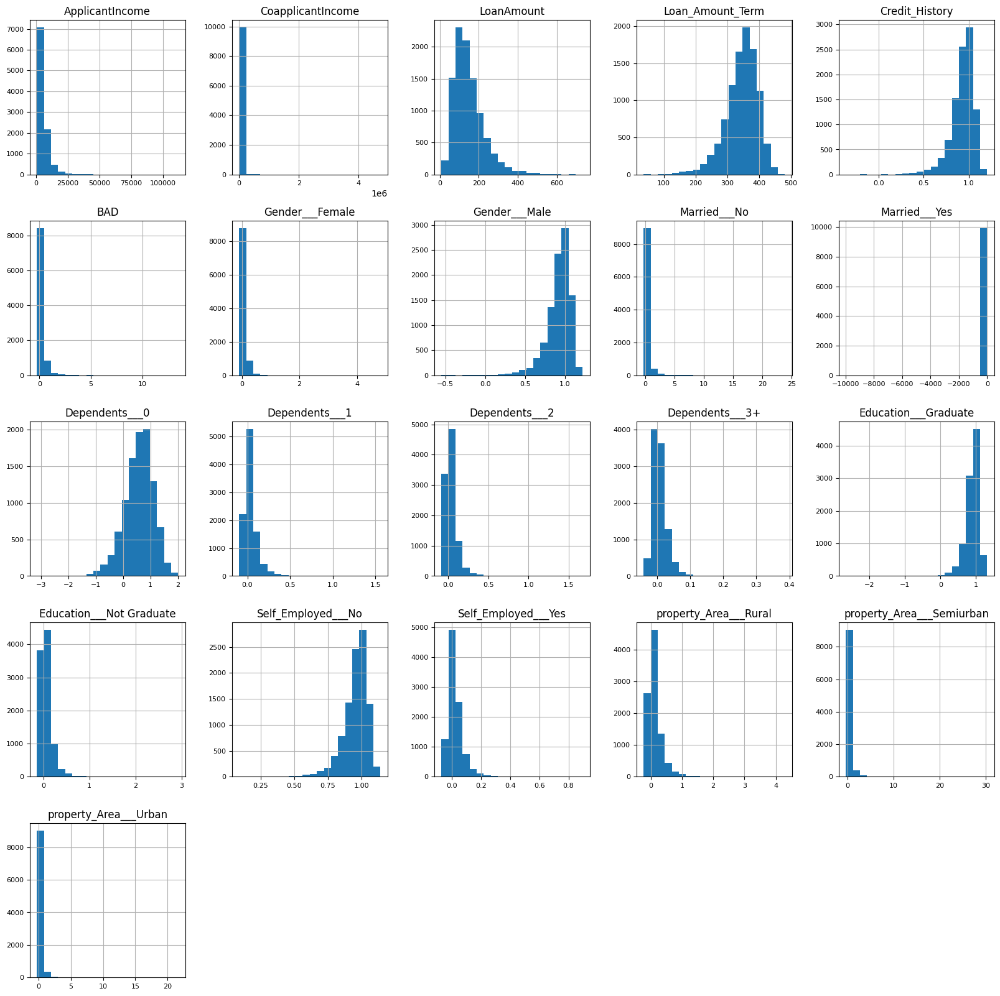

100000Simulations


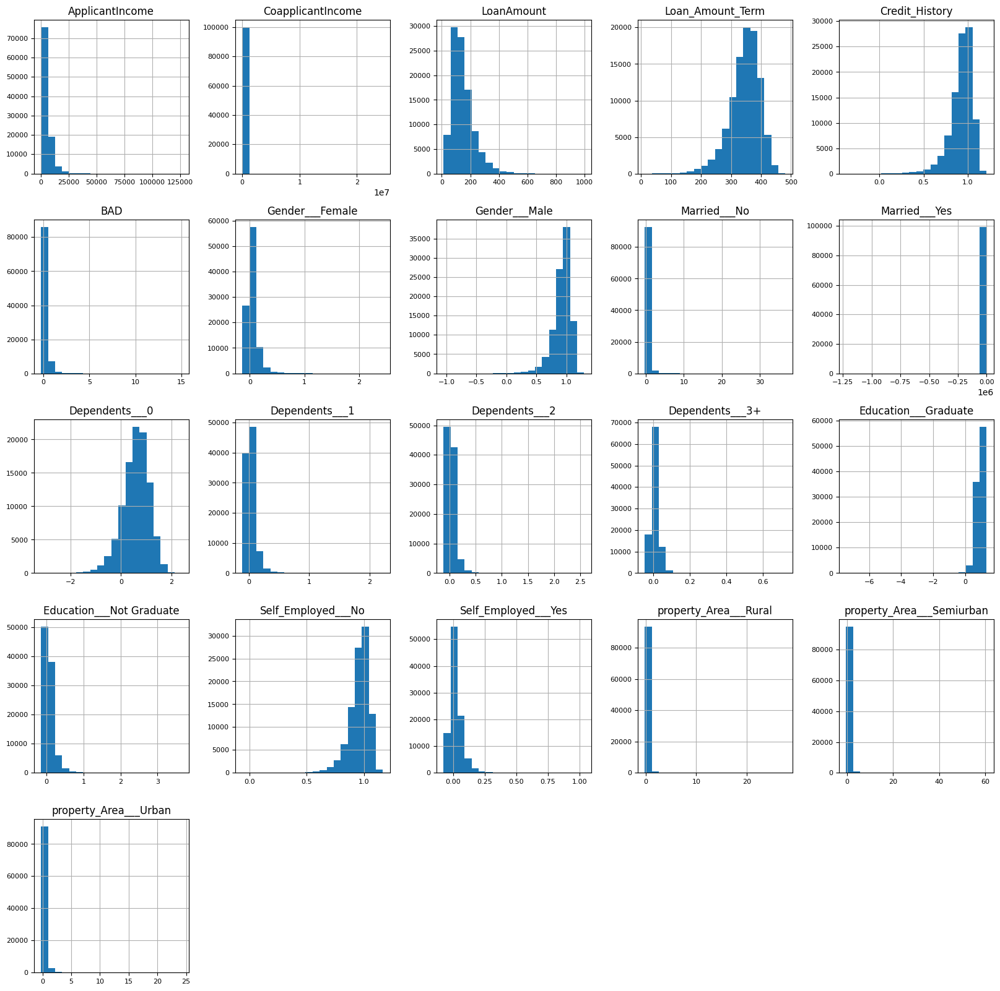

1000000Simulations


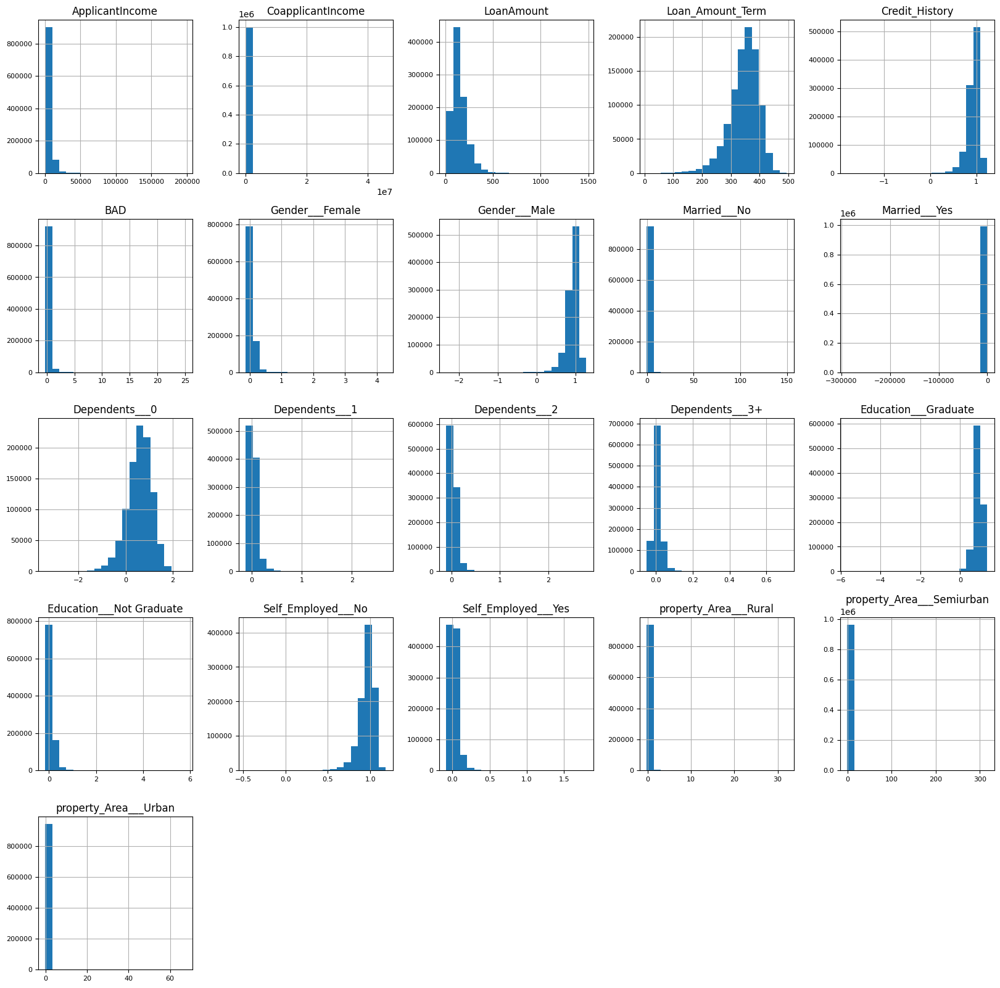

Dataframe 2 out of 4 Dataframes
1000Simulations


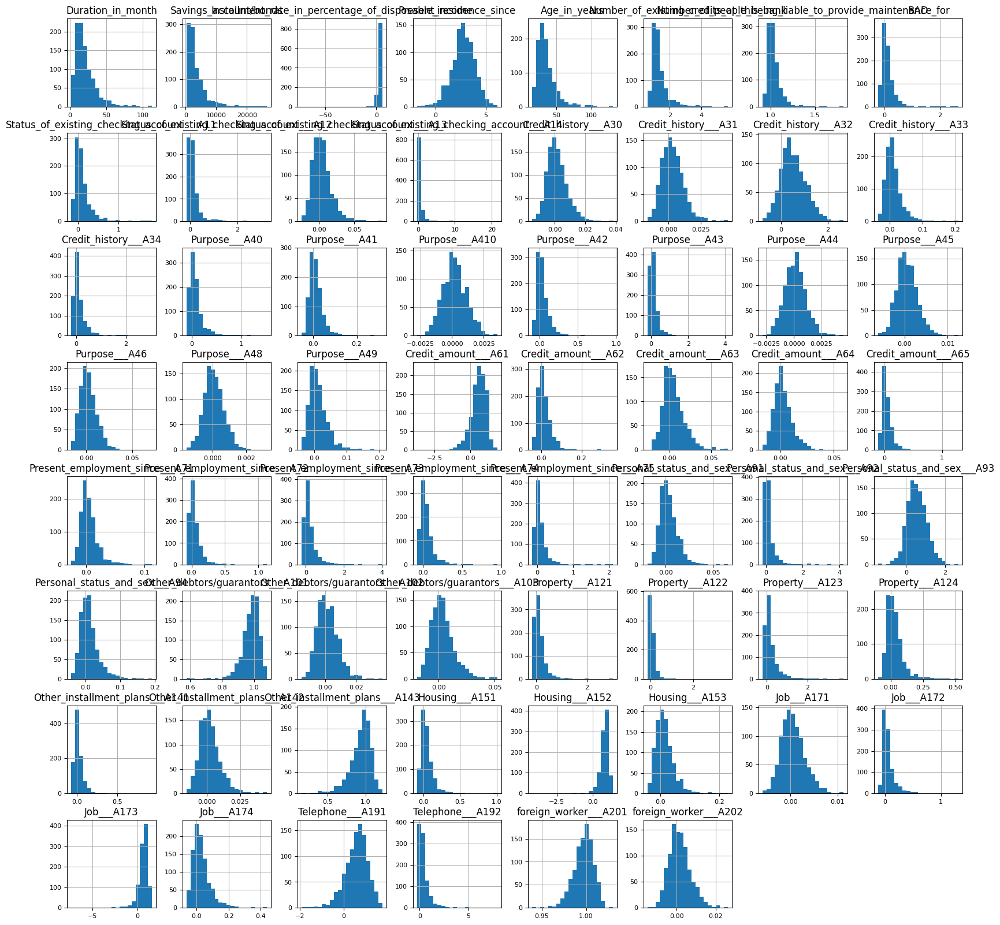

10000Simulations


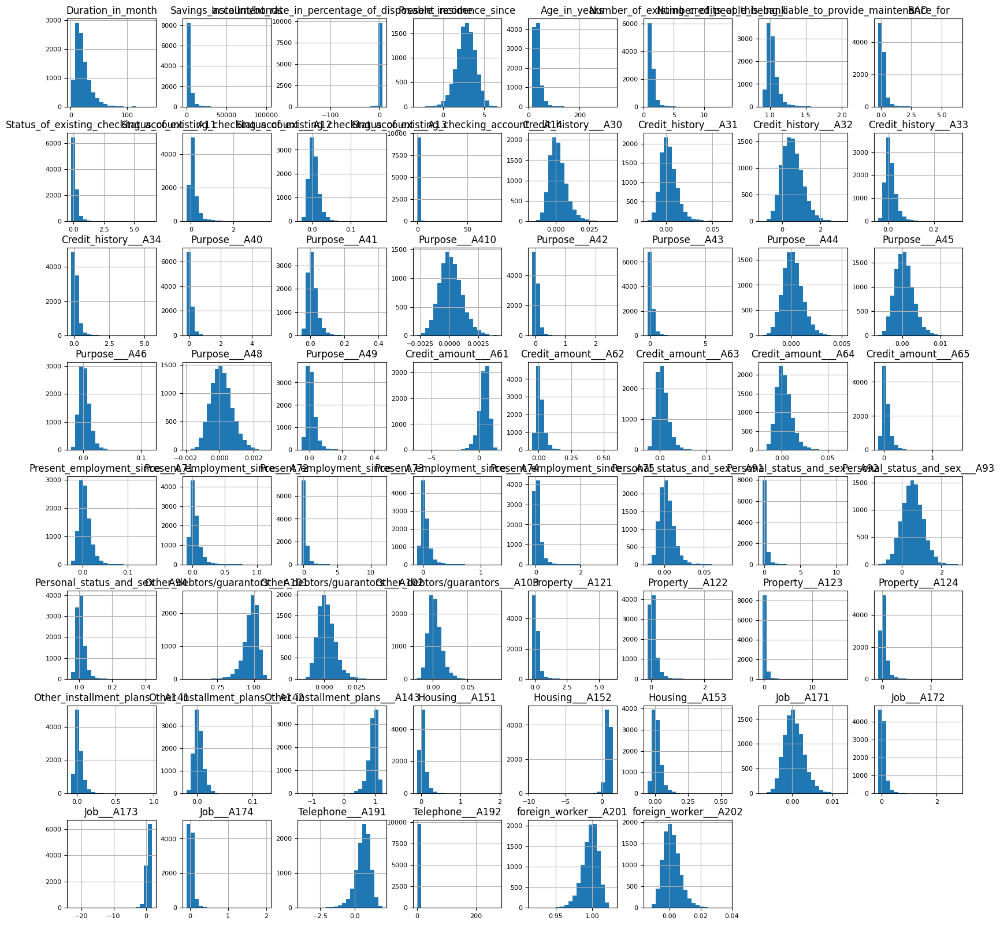

100000Simulations


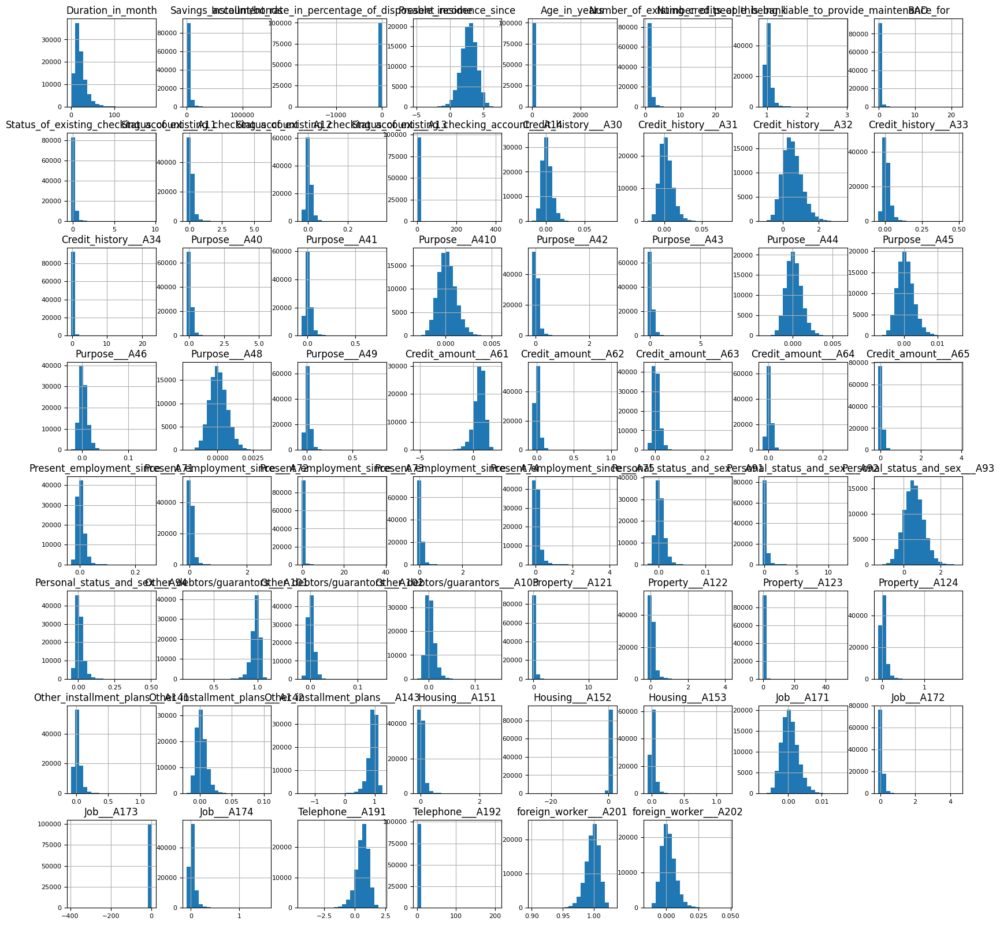

1000000Simulations


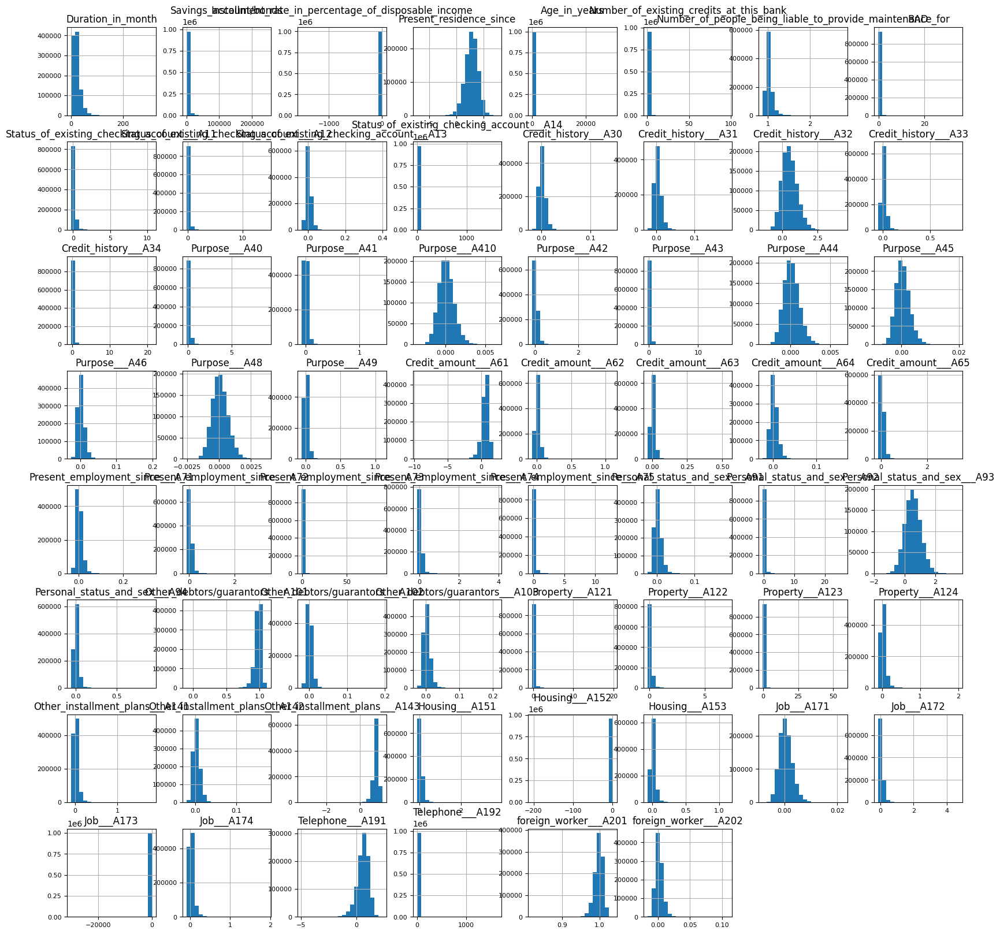

Dataframe 3 out of 4 Dataframes
1000Simulations


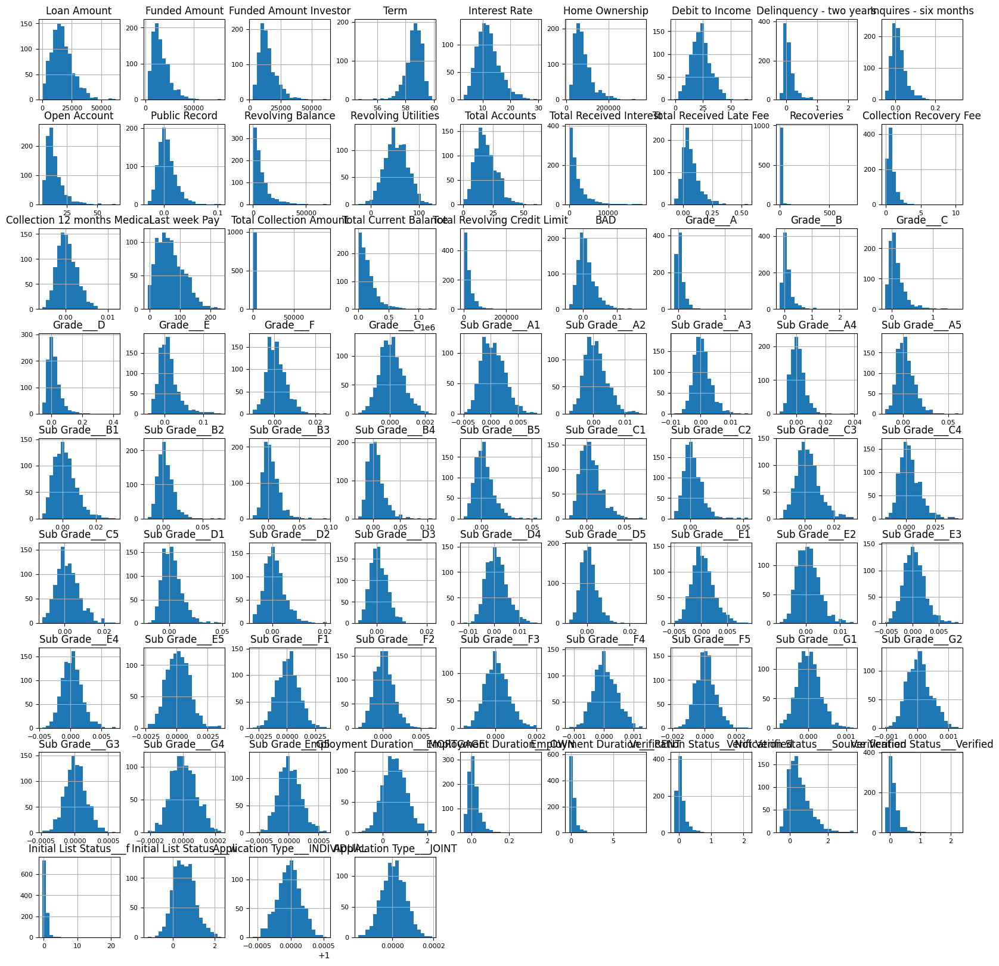

10000Simulations


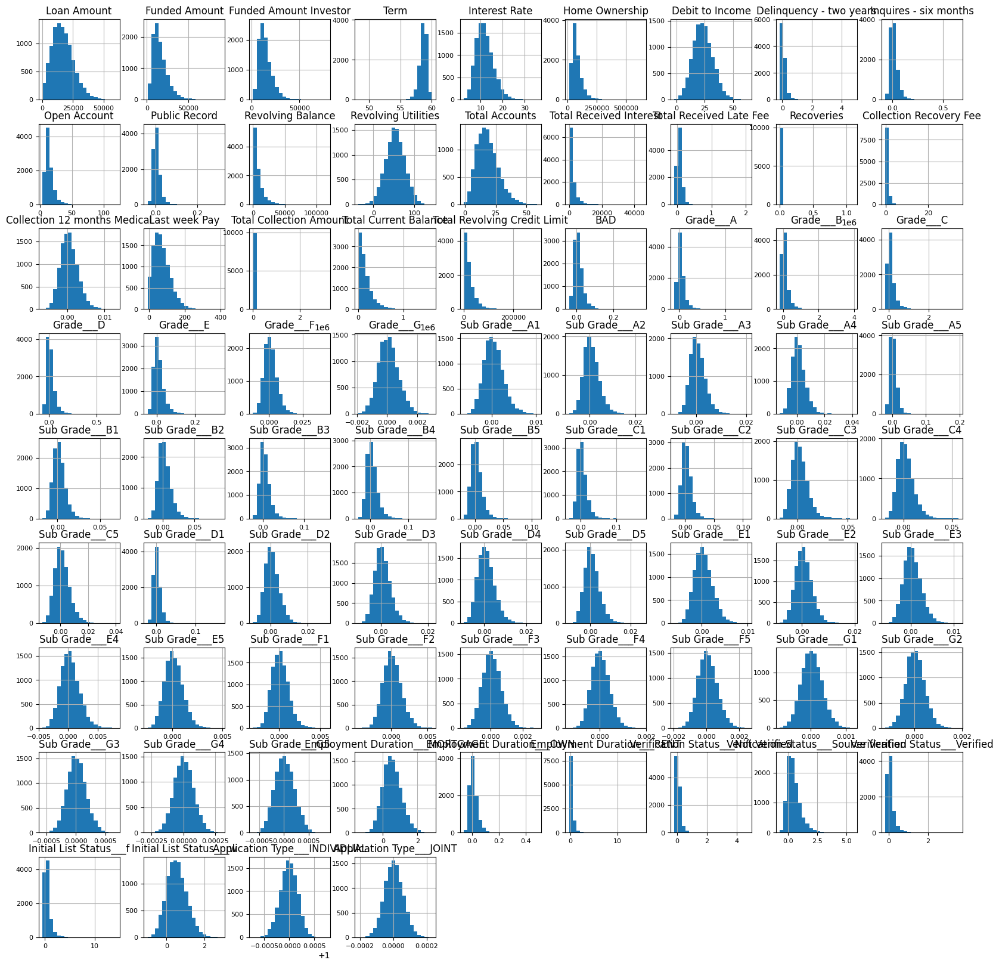

100000Simulations


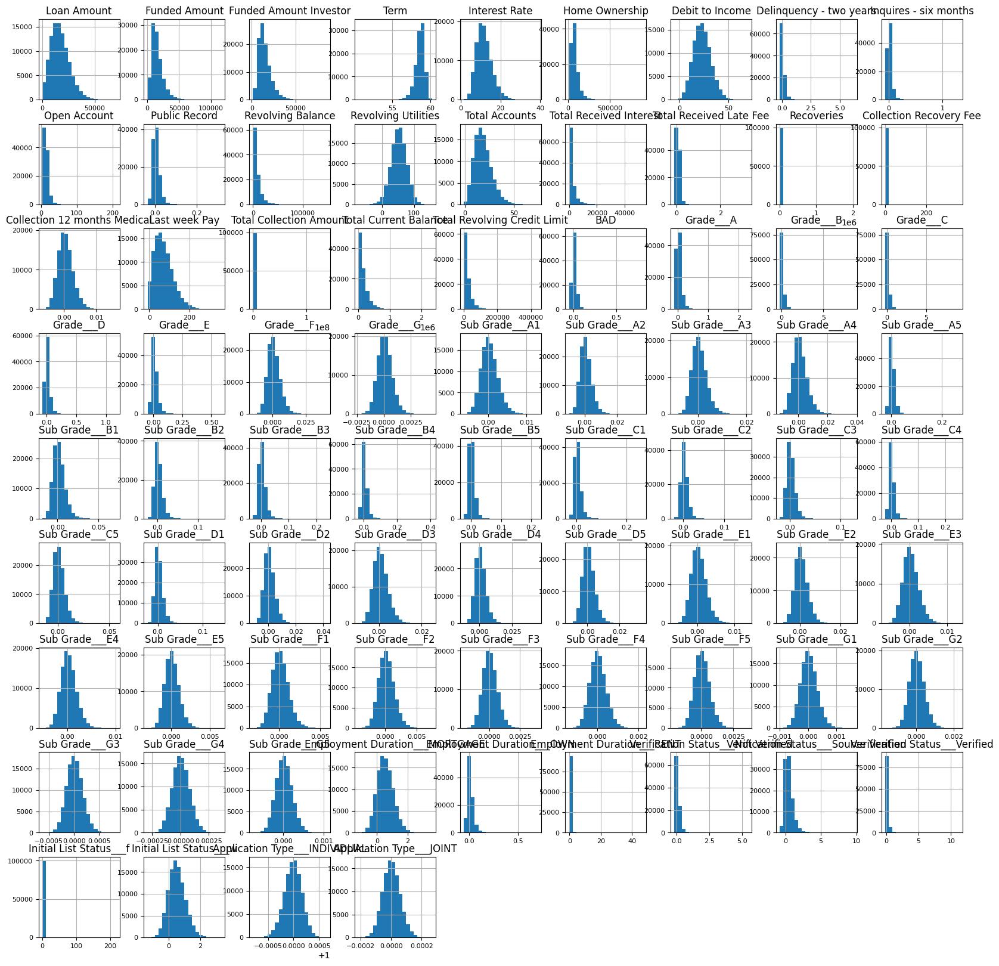

1000000Simulations


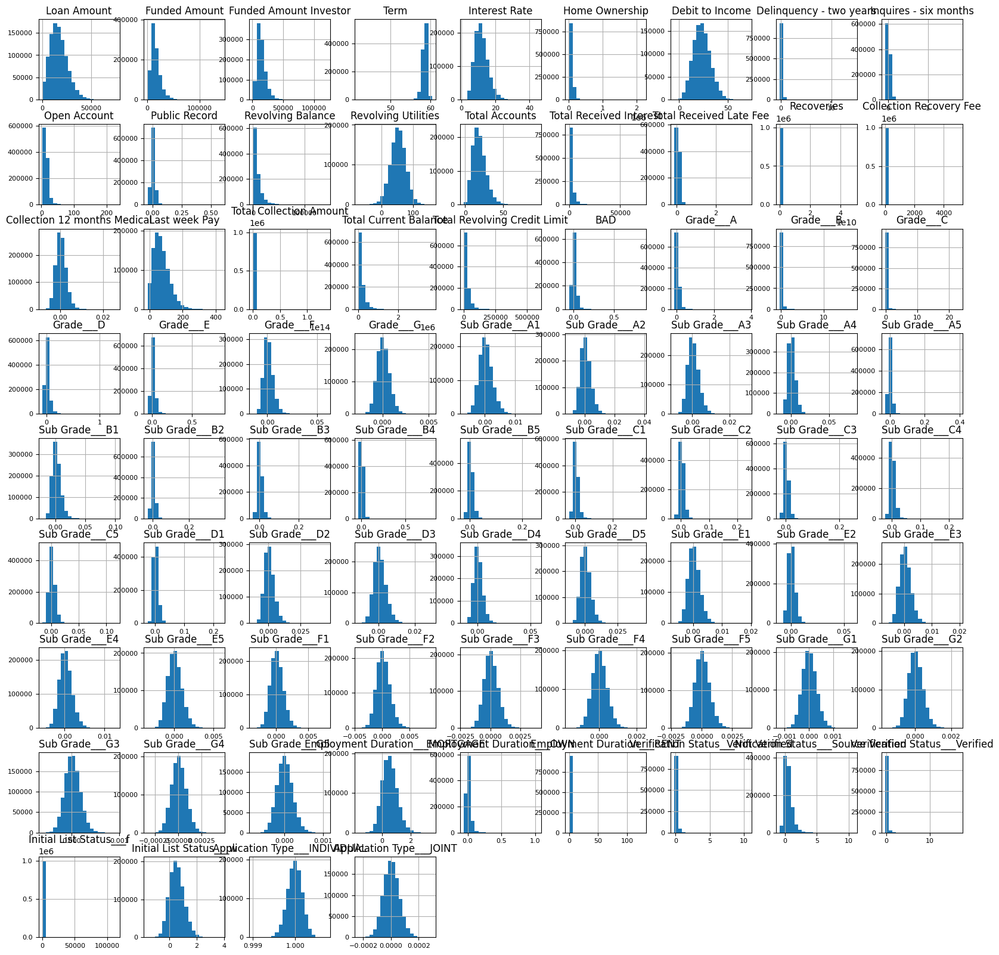

Dataframe 4 out of 4 Dataframes
1000Simulations


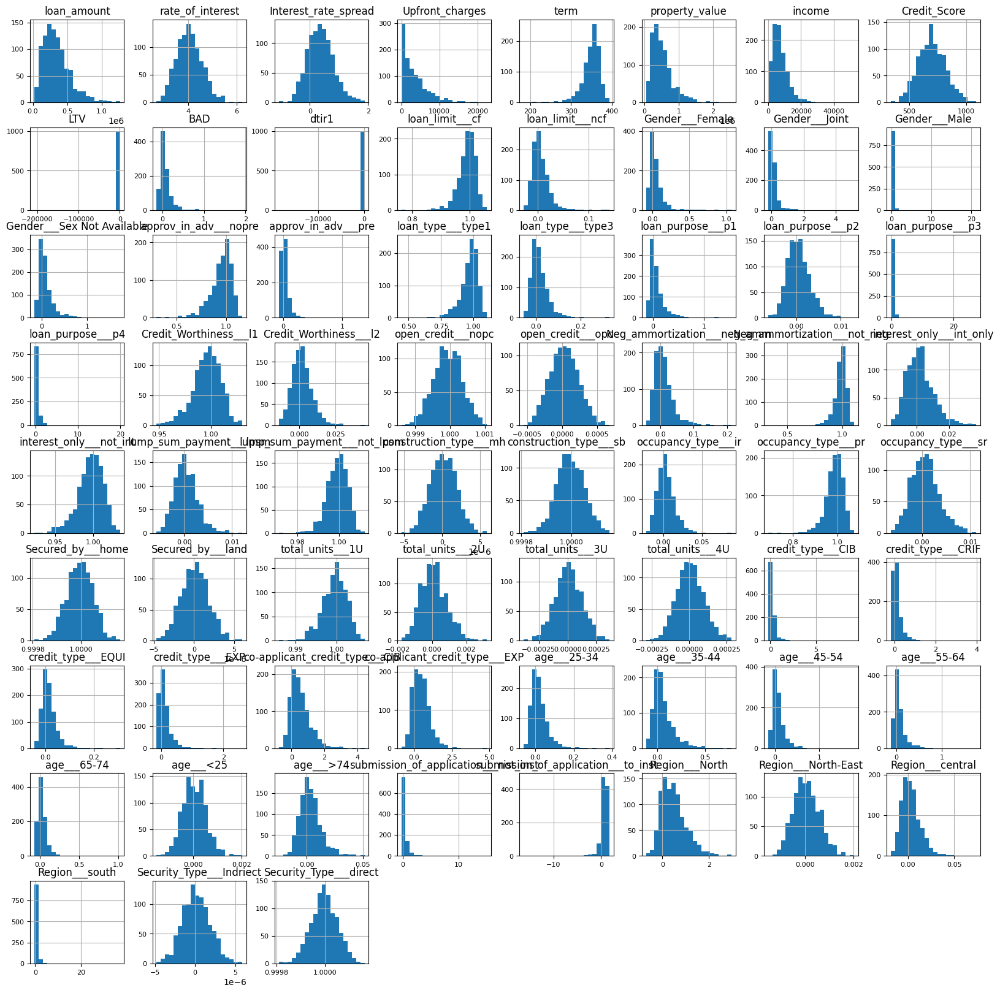

10000Simulations


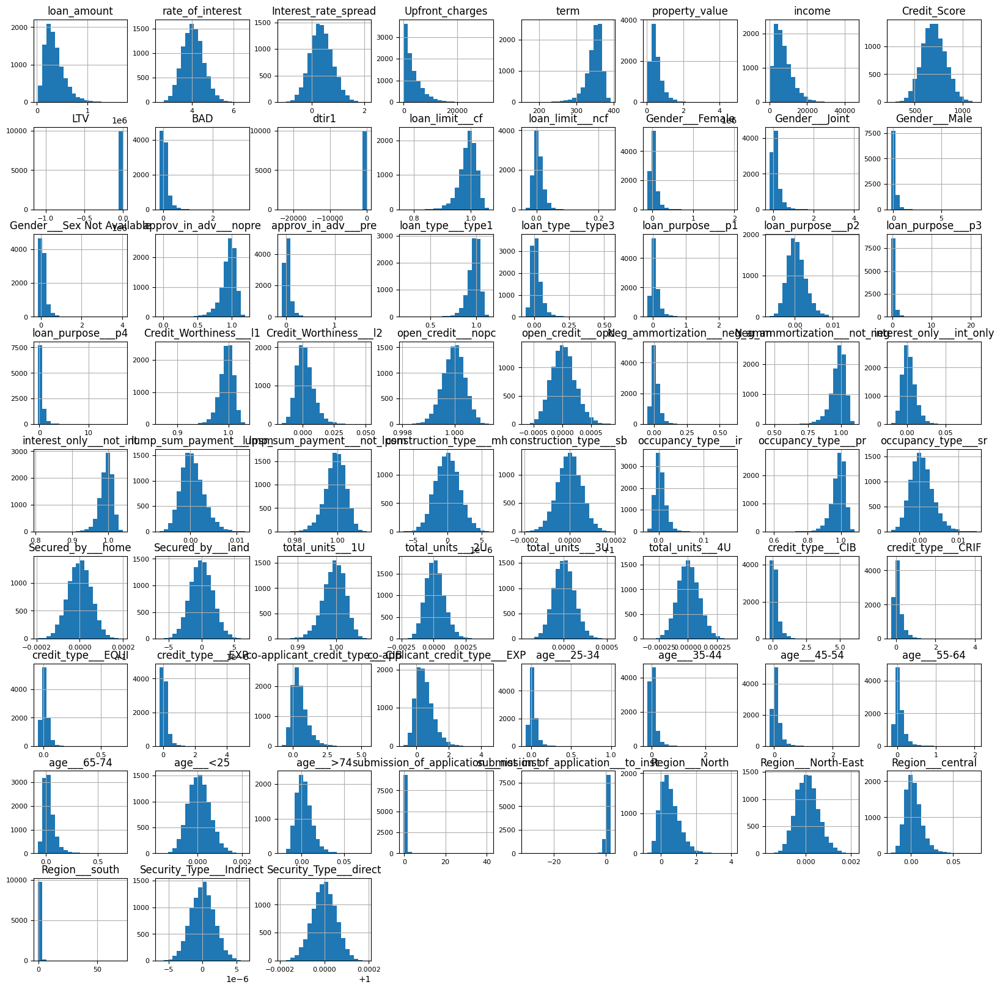

100000Simulations


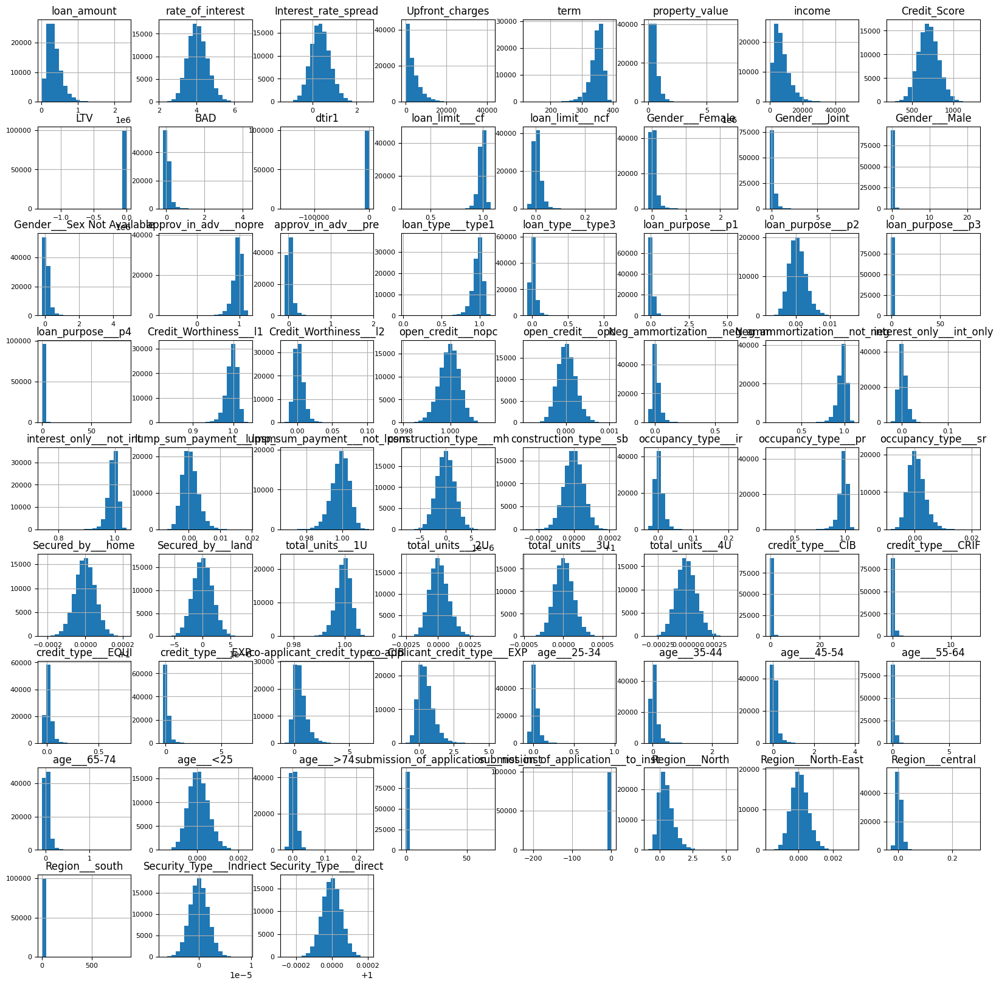

1000000Simulations


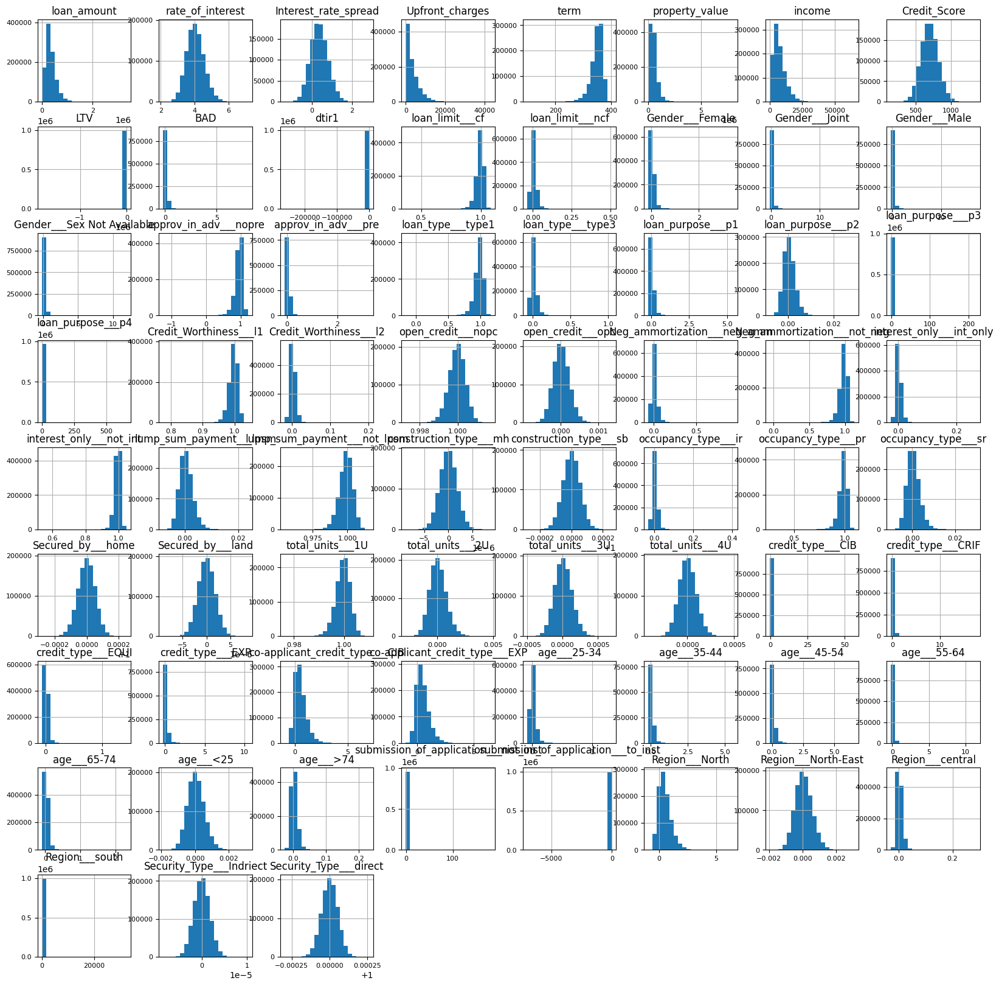

In [ ]:
# Plot back-transformed simulations
simulation_demonstration(df_list, simulations, plot_back_transformed_simulation=True)

In [ ]:
# Generate tables for correlation matrix differences
single_matrix_diffs, sim_matrix_diffs = simulation_demonstration(df_list, simulations, return_diff=True)

In [ ]:
single_matrix_diffs

,original vs. transformed,transformed vs. cleaned
Datasets,,
Small,0.014890,0.004762
German,0.001974,0.001613
Deloitte,0.001726,0.001316
Large,0.003007,0.001493


In [ ]:
sim_matrix_diffs

original vs. simulated & correlated  \
number of simulations dataset                                         
1000                  Small                                0.035361   
                      German                               0.022821   
                      Deloitte                             0.020632   
                      Large                                0.019878   
10000                 Small                                0.026302   
                      German                               0.010628   
                      Deloitte                             0.007066   
                      Large                                0.006603   
100000                Small                                0.025429   
                      German                               0.008570   
                      Deloitte                             0.004039   
                      Large                                0.002817   
1000000               Small                                0.027390   
                      German                               0.011136   
                      Deloitte                             0.007114   
                      Large                                0.006242   

                                simulated, correlated & back-transformed  
number of simulations dataset                                             
1000                  Small                                     0.049475  
                      German                                    0.046313  
                      Deloitte                                  0.047104  
                      Large                                     0.047679  
10000                 Small                                     0.036445  
                      German                                    0.026296  
                      Deloitte                                  0.025729  
                      Large                                     0.027398  
100000                Small                                     0.026406  
                      German                                    0.009509  
                      Deloitte                                  0.005115  
                      Large                                     0.004369  
1000000               Small                                     0.033771  
                      German                                    0.021283  
                      Deloitte                                  0.018356  
                      Large                                     0.019208

In [ ]:
# There were not enough computaional ressources to plot the full, back-transformed and de-dummified simulations for the previous number of simulations.
# The smaller one below gives an idea about the distribution of the full simulations
simulations_small=[1000, 10000]

In [ ]:
simulated_dfs = simulation_demonstration(df_list, simulations_small, return_dfs=True)

1000 Simulations
Dataframe 1 out of 4 Dataframes


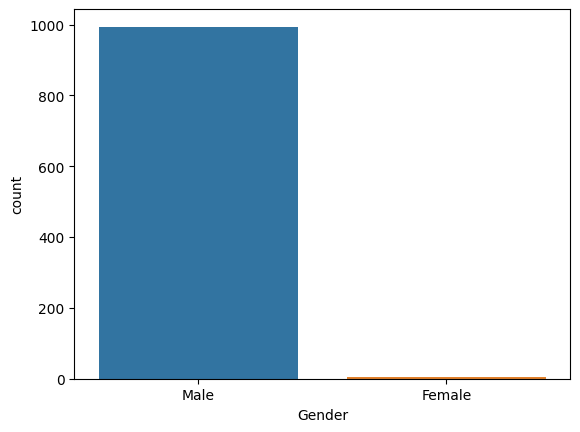

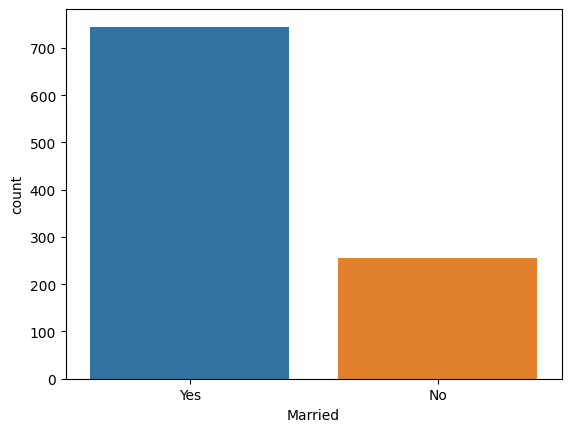

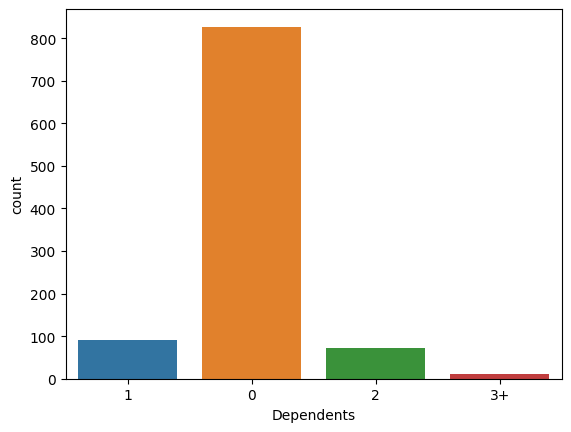

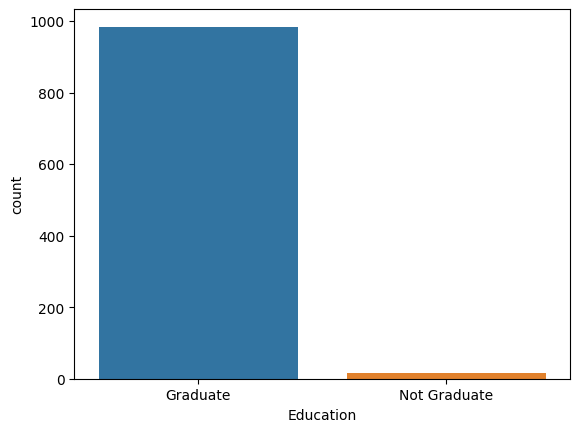

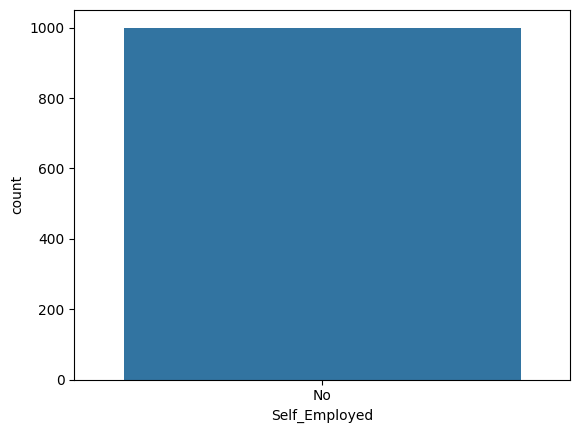

...

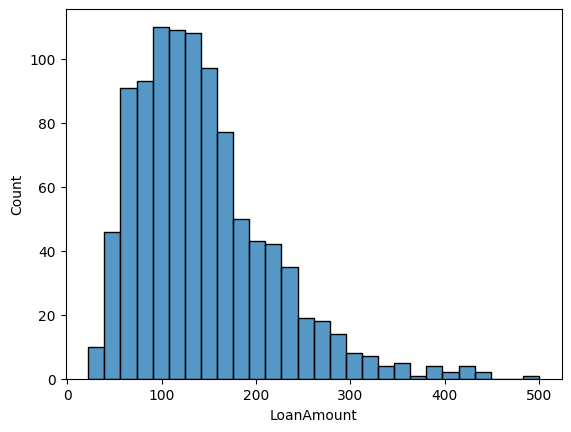

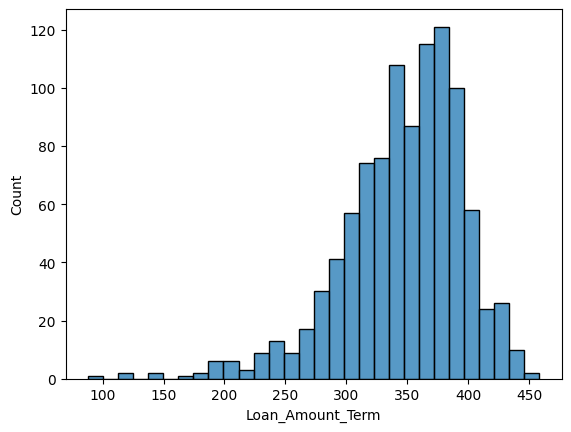

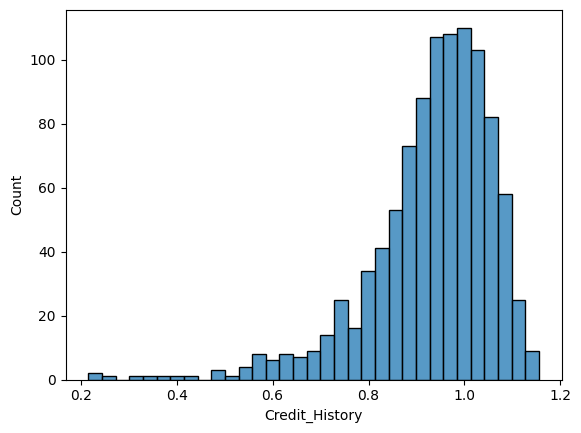

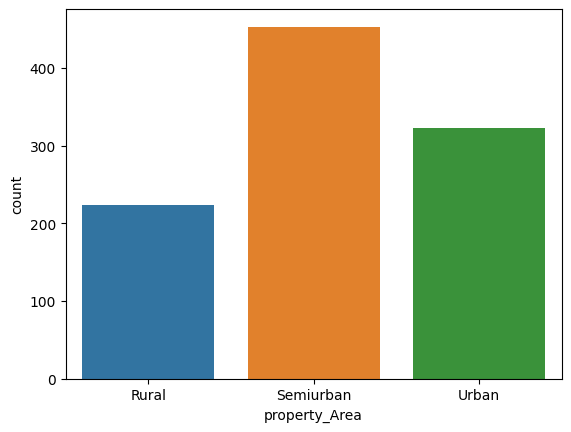

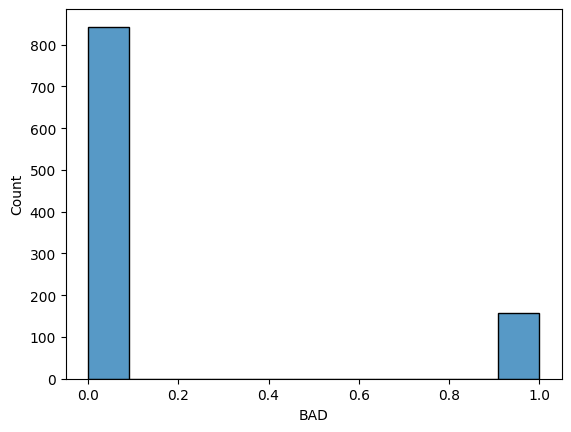

1000 Simulations
Dataframe 1 out of 4 Dataframes


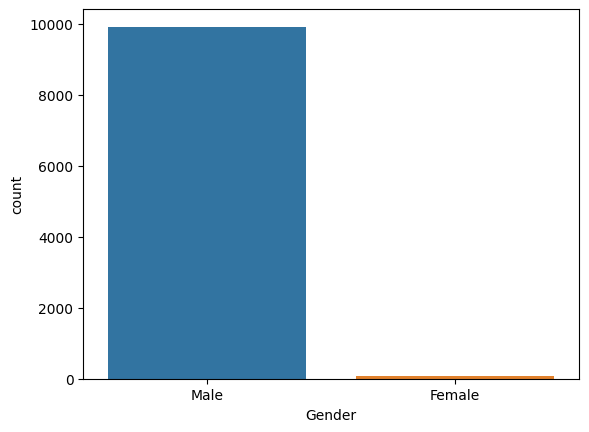

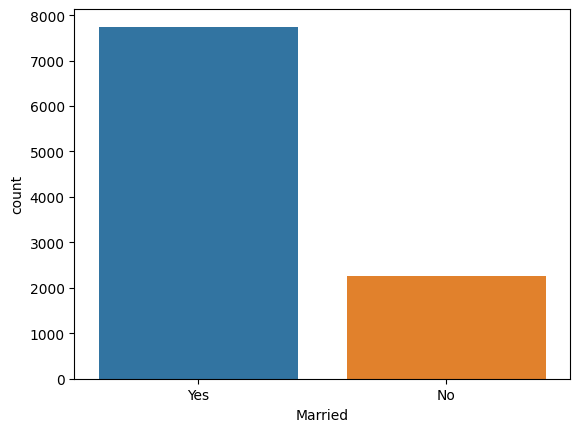

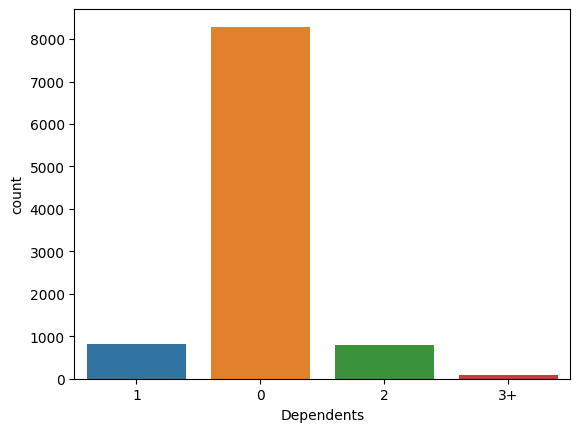

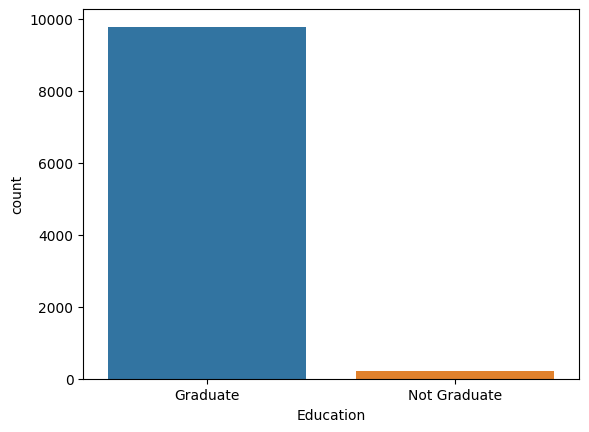

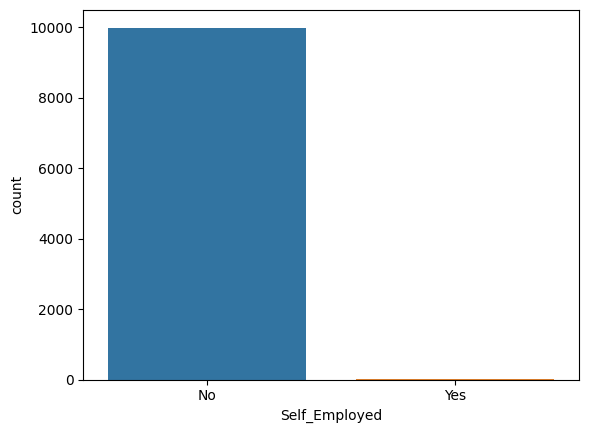

...

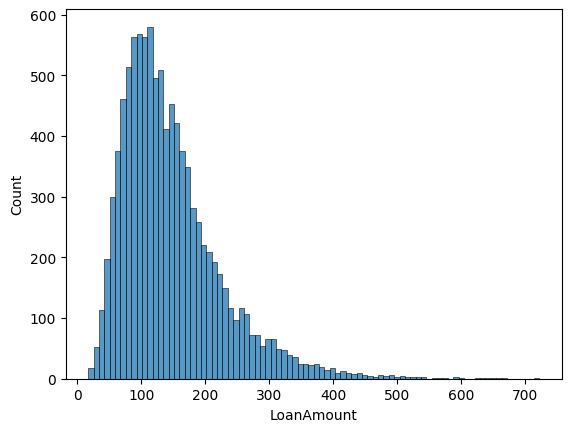

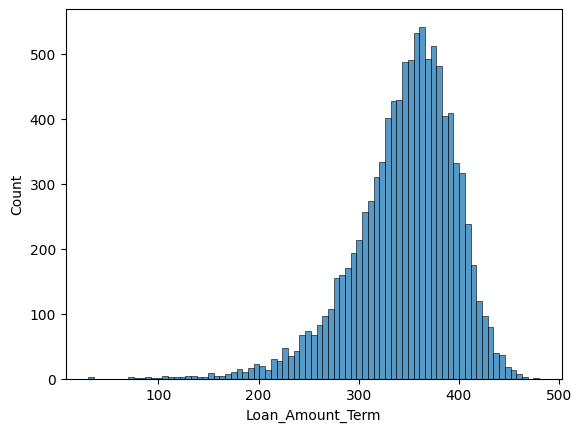

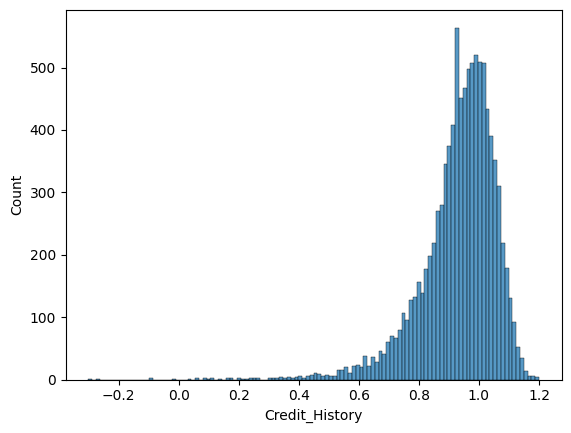

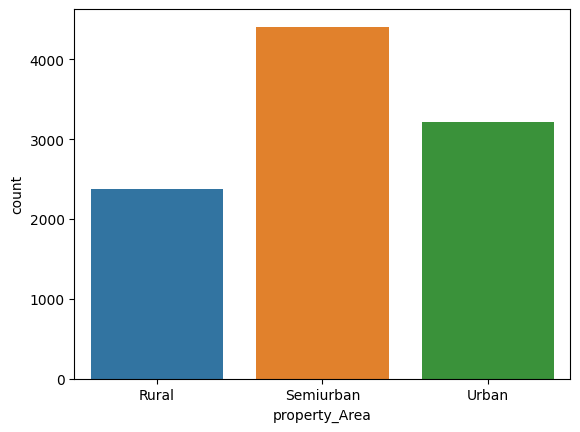

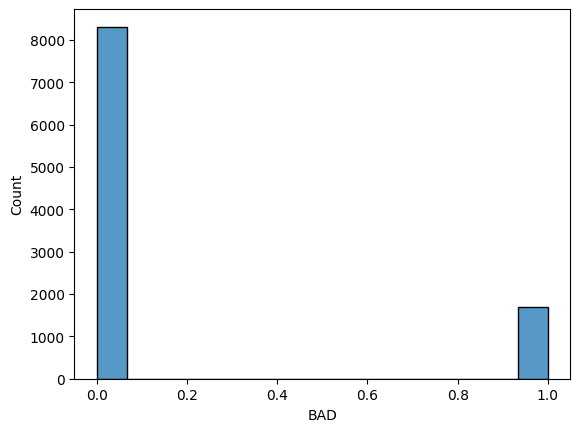

10000 Simulations
Dataframe 2 out of 4 Dataframes


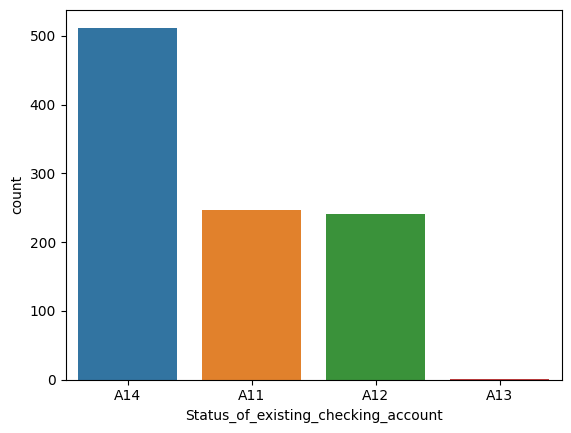

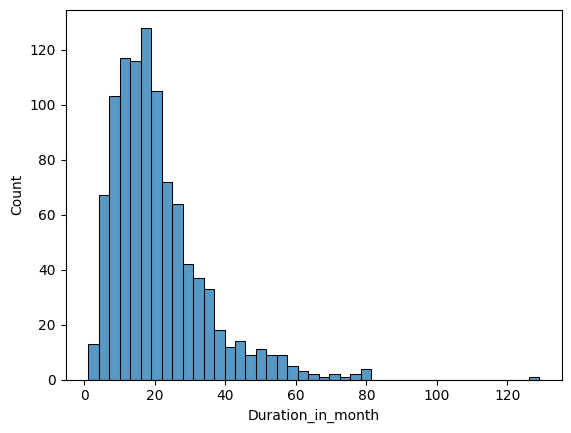

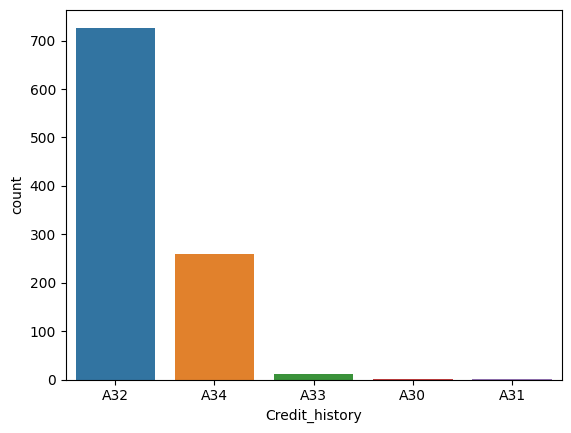

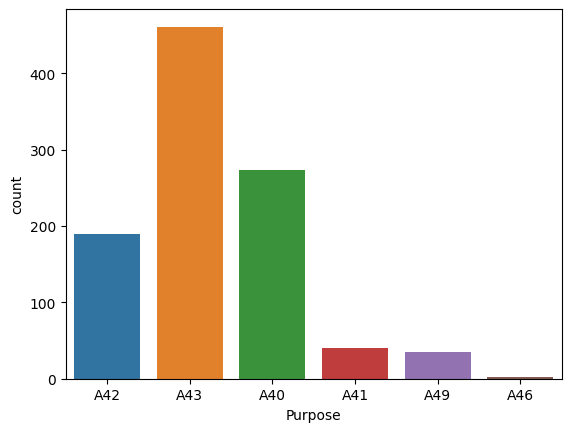

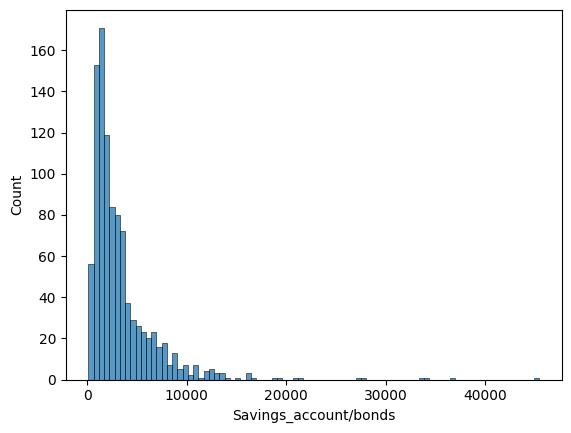

...

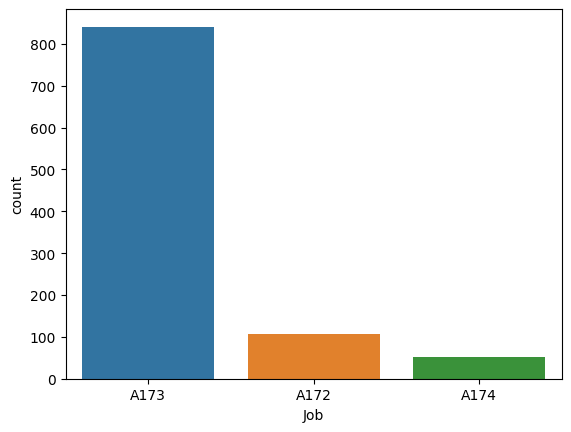

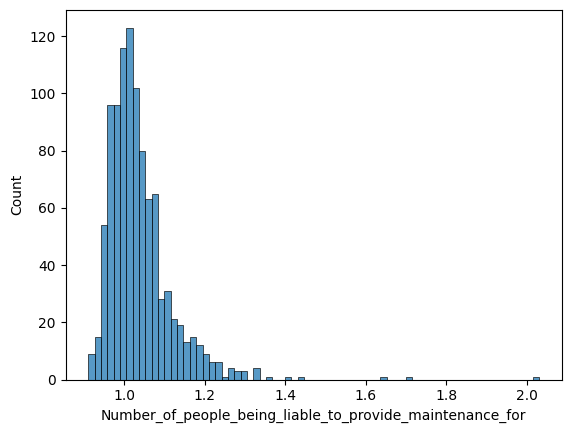

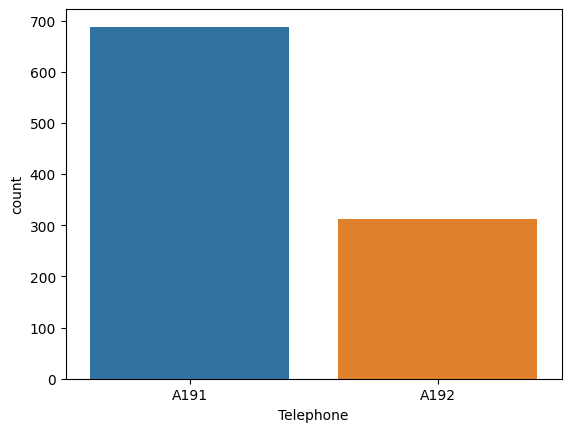

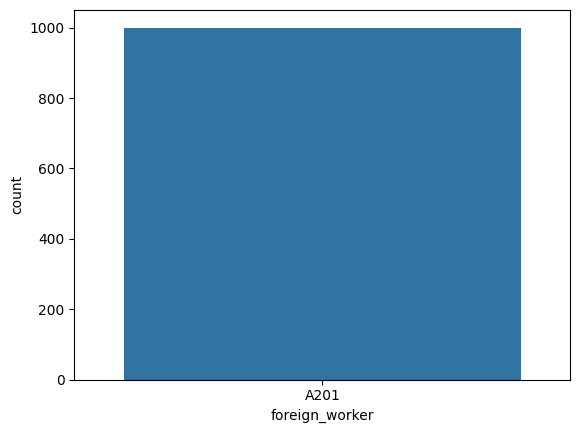

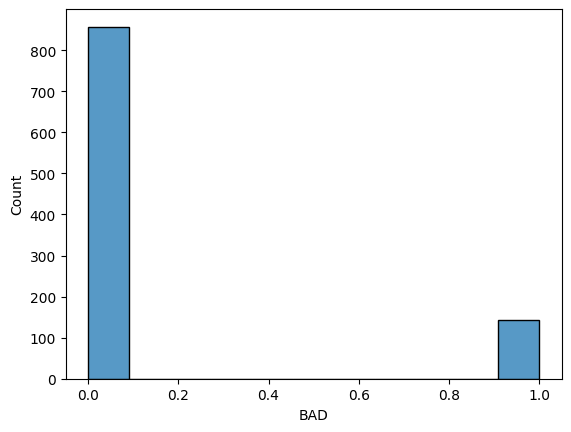

10000 Simulations
Dataframe 2 out of 4 Dataframes


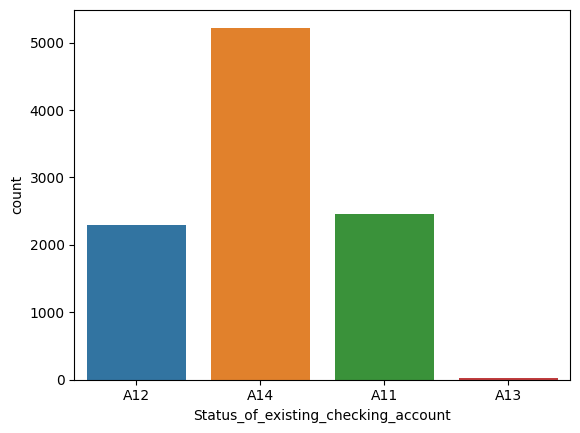

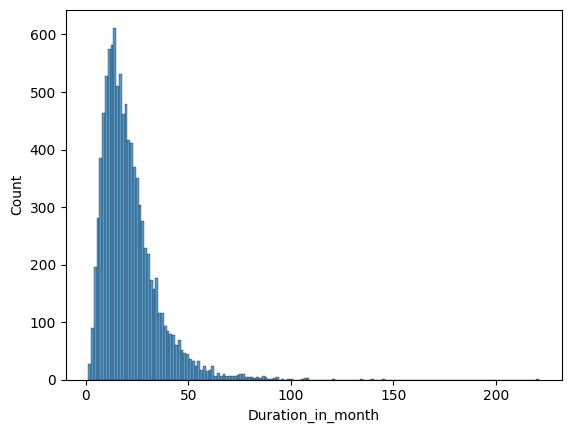

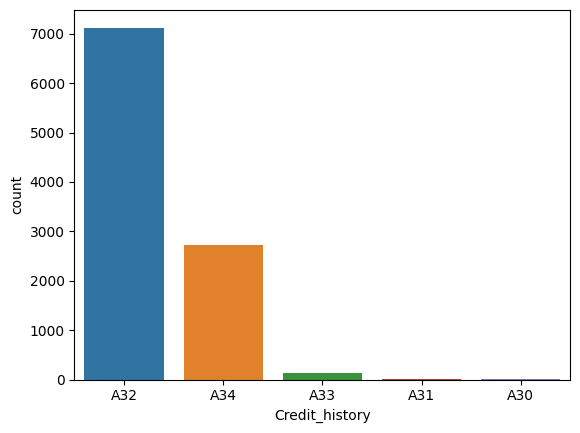

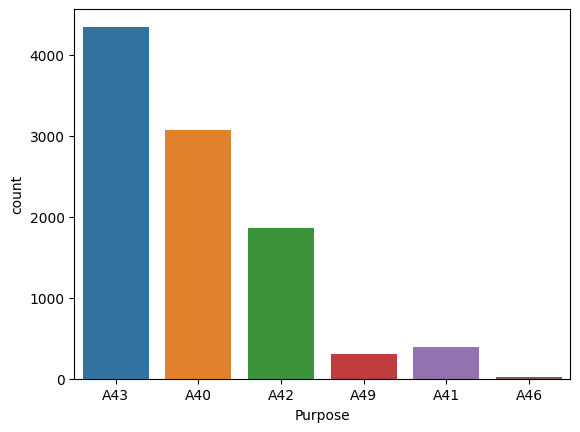

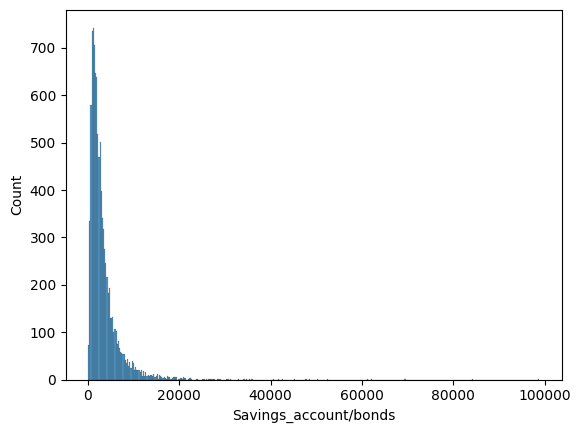

...

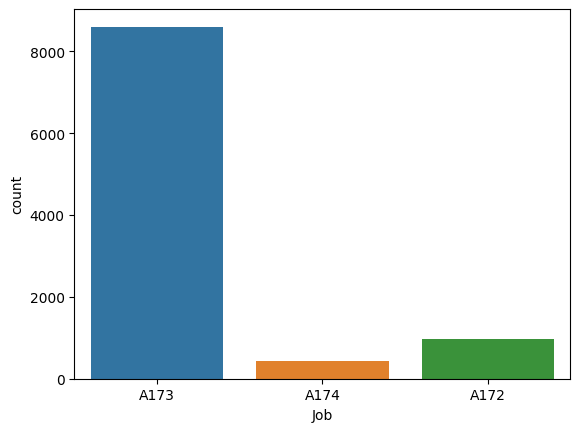

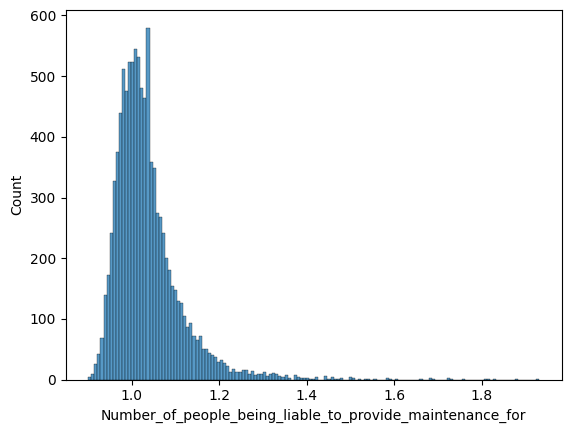

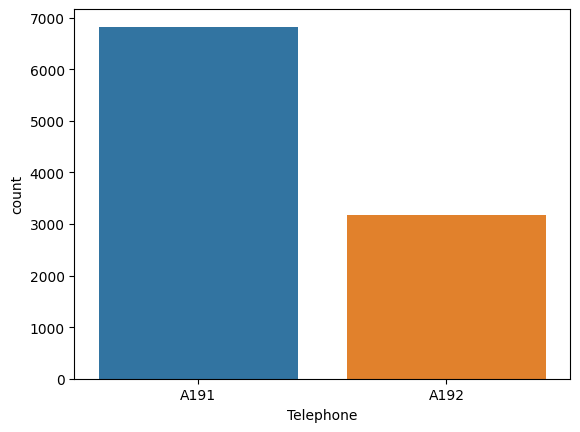

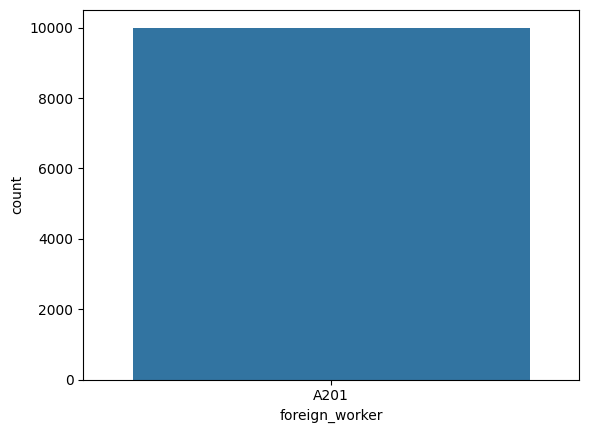

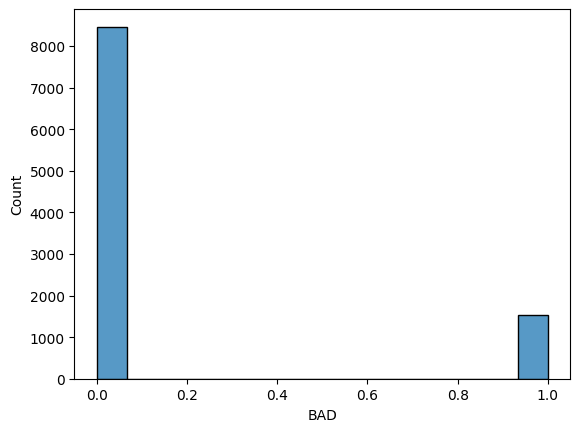

In [ ]:
count=0
for simulation, number in zip(simulated_dfs, simulations_small):
    count+=1
    for df in simulation:
        print(str(number) + ' Simulations')
        print('Dataframe ' + str(count) + ' out of ' + str(len(simulated_dfs)) + ' Dataframes')
        for col in df.columns:

            # Check if the column is numeric
            if pd.api.types.is_numeric_dtype(df[col]):

                # If it's numeric, plot a histogram
                sns.histplot(data=df, x=col)

            else:
                # If it's not numeric, plot a countplot
                sns.countplot(data=df, x=col)

            # Show the plot
            plt.show()